# Machine Learning Project on City Growth Dataset

## Import the required libraries

In [3]:
!where python

C:\Users\User\anaconda3\python.exe
C:\Users\User\AppData\Local\Programs\Python\Python313\python.exe
C:\Users\User\AppData\Local\Microsoft\WindowsApps\python.exe


In [4]:
!pip install pandas

In [5]:
!pip install seaborn

In [6]:
!pip install scipy

In [7]:
!pip install scikit-learn

In [8]:
# import pandas
# this library help us to convert different data files (structured or semi structured) into pandas data frame
import pandas as pd

# import numpy
# this library help us to perform different numerical and statistical operations on different data structures
import numpy as np

# import seaborn and matplotlib
# these both libraries help us to create visualization
import seaborn as sns
import matplotlib.pyplot as plt

## Load the Dataset

In [10]:
# Load the file from local
df_city_growth_dataset = pd.read_csv('synthetic_tier2_tier3_city_growth_dataset.csv')

In [11]:
# Show the first five observations
df_city_growth_dataset.head()

,City_Name,State,Year,Population,Job_Postings,College_Count,Skill_Center_Count,Green_Cover_Percentage,Internet_Penetration_Rate,Startup_Count,Road_Connectivity_Score,Public_Transport_Availability,Affordability_Index,Opportunity_Access_Score
0,Panipat,Haryana,2023,231932,38158,72,21,17.80,48.58,330,45.92,33.37,14.29,65.09
1,Visakhapatnam,Andhra Pradesh,2023,427069,2433,64,21,40.87,73.64,252,43.19,29.12,61.19,13.95
2,Solapur,Maharashtra,2023,748143,189,62,47,40.92,61.04,243,59.24,4.65,60.75,17.05
3,Panipat,Haryana,2021,765987,8792,60,14,50.42,56.75,564,23.09,24.10,68.33,61.00
4,Hubli,Karnataka,2022,704365,35920,36,40,47.77,63.38,565,54.67,18.49,96.96,77.51


In [12]:
# Show the last five observations
df_city_growth_dataset.tail()

,City_Name,State,Year,Population,Job_Postings,College_Count,Skill_Center_Count,Green_Cover_Percentage,Internet_Penetration_Rate,Startup_Count,Road_Connectivity_Score,Public_Transport_Availability,Affordability_Index,Opportunity_Access_Score
11995,Jalandhar,Punjab,2021,1215798,32666,66,17,10.63,70.05,844,0.17,51.05,53.95,9.70
11996,Gangtok,Sikkim,2020,1472578,22176,34,23,13.40,57.63,54,0.26,44.91,97.76,44.99
11997,Jalandhar,Punjab,2022,212479,38083,45,7,51.61,67.87,814,13.87,4.82,68.05,37.74
11998,Udaipur,Rajasthan,2025,1252439,35710,83,30,25.10,69.29,340,71.80,14.03,17.99,28.27
11999,Saharanpur,Uttar Pradesh,2020,1727029,33724,36,1,57.63,47.17,978,15.76,94.92,0.82,73.69


## Basic data overview

In [14]:
# Check the shape of the data
df_city_growth_dataset.shape

(12000, 14)

**Inference**
 - We have 12000 observations and 14 attributes.

In [16]:
# Check the columns of the data
df_city_growth_dataset.columns

Index(['City_Name', 'State', 'Year', 'Population', 'Job_Postings',
       'College_Count', 'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

In [17]:
# Check the basic info
df_city_growth_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12000 entries, 0 to 11999
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   City_Name                      12000 non-null  object 
 1   State                          12000 non-null  object 
 2   Year                           12000 non-null  int64  
 3   Population                     12000 non-null  int64  
 4   Job_Postings                   12000 non-null  int64  
 5   College_Count                  12000 non-null  int64  
 6   Skill_Center_Count             12000 non-null  int64  
 7   Green_Cover_Percentage         12000 non-null  float64
 8   Internet_Penetration_Rate      12000 non-null  float64
 9   Startup_Count                  12000 non-null  int64  
 10  Road_Connectivity_Score        12000 non-null  float64
 11  Public_Transport_Availability  12000 non-null  float64
 12  Affordability_Index            12000 non-null 

**Interpretation**
 - We have 12 numerical columns and 2 categorical columns.
 - The data we have, acquires 1.3+ MB storage space.
 - We don't have any valid null records in the data.

In [19]:
# Describe the Dataset
df_city_growth_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,12000.0,2.022511e+03,1.695767,2020.00,2021.0000,2023.000,2.024000e+03,2025.00
Population,12000.0,1.046930e+06,548695.399740,100086.00,569893.7500,1046729.000,1.523176e+06,1999458.00
Job_Postings,12000.0,2.510534e+04,14458.198854,0.00,12520.7500,24873.000,3.768850e+04,49999.00
College_Count,12000.0,4.960617e+01,28.643055,1.00,25.0000,49.000,7.500000e+01,99.00
Skill_Center_Count,12000.0,2.523325e+01,14.160593,1.00,13.0000,25.000,3.800000e+01,49.00
Green_Cover_Percentage,12000.0,3.511762e+01,14.482362,10.00,22.5275,35.200,4.773250e+01,60.00
Internet_Penetration_Rate,12000.0,6.742792e+01,15.877796,40.00,53.7375,67.460,8.126000e+01,94.99
Startup_Count,12000.0,4.978018e+02,289.980634,0.00,244.7500,498.000,7.480000e+02,999.00
Road_Connectivity_Score,12000.0,5.012148e+01,28.915428,0.01,25.0700,50.025,7.544250e+01,100.00
Public_Transport_Availability,12000.0,4.992319e+01,28.917999,0.00,24.6175,50.010,7.500500e+01,99.99


**Interpretation**
 - From this, we can easily identify the outliers, by looking at the difference between mean and 50%(median)

# Data Preprocessing

### Null Value Handling

In [23]:
# Check the count of null records present in the data frame
df_city_growth_dataset.isnull().sum()

City_Name                        0
State                            0
Year                             0
Population                       0
Job_Postings                     0
College_Count                    0
Skill_Center_Count               0
Green_Cover_Percentage           0
Internet_Penetration_Rate        0
Startup_Count                    0
Road_Connectivity_Score          0
Public_Transport_Availability    0
Affordability_Index              0
Opportunity_Access_Score         0
dtype: int64

**Interpretation**
 - In the data we don't have any null records.

## EDA(Exploratory Data Analysis)

### Univariate Analysis

In [27]:
# Seggregate the data based on the data type
df_num = df_city_growth_dataset.select_dtypes(include = 'number')

In [28]:
# Make a separate data frame for categorical variables
df_cat = df_city_growth_dataset.select_dtypes(include = 'object')

#### Perform Univariate Analysis on Numerical Data

In [30]:
# Show the Numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### YEAR

In [32]:
# show the minimum 
df_num.Year.min()

np.int64(2020)

In [33]:
# show the maximum 
df_num.Year.max()

np.int64(2025)

In [34]:
# show the Average
df_num.Year.mean().round(2)

np.float64(2022.51)

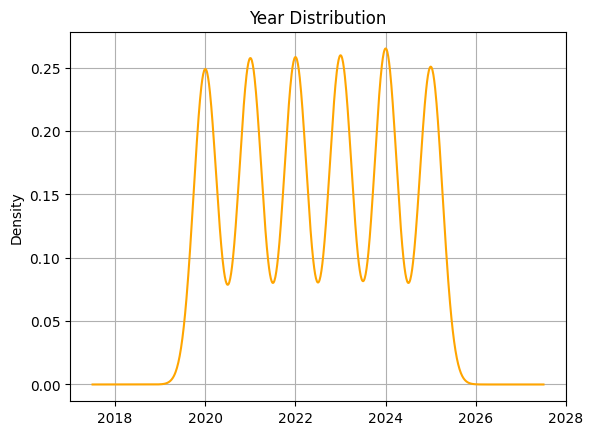

In [35]:
# show the distribution of the single numerical column
df_num.Year.plot(kind='kde',color='orange')
plt.title('Year Distribution')
plt.grid()
plt.show()

In [36]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### POPULATION

In [38]:
# show the minimum 
df_num.Population.min()

np.int64(100086)

In [39]:
# show the maximum 
df_num.Population.max()

np.int64(1999458)

In [40]:
# show the Average
df_num.Population.mean().round(2)

np.float64(1046930.29)

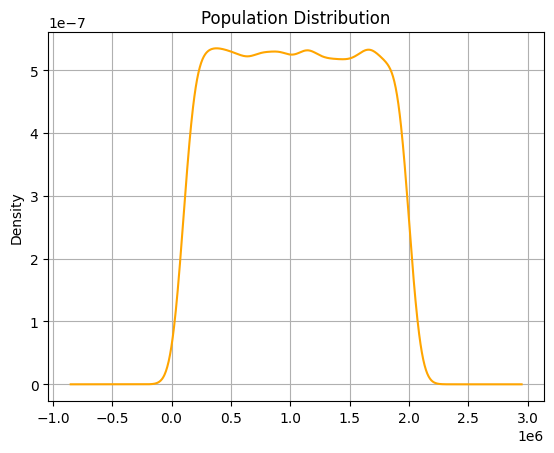

In [41]:
# show the distribution of the single numerical column
df_num.Population.plot(kind='kde',color='orange')
plt.title('Population Distribution')
plt.grid()
plt.show()

In [42]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### JOB_POSTING

In [44]:
# show the minimum 
df_num.Job_Postings.min()

np.int64(0)

In [45]:
# show the maximum 
df_num.Job_Postings.max()

np.int64(49999)

In [46]:
# show the Average
df_num.Job_Postings.mean().round(2)

np.float64(25105.34)

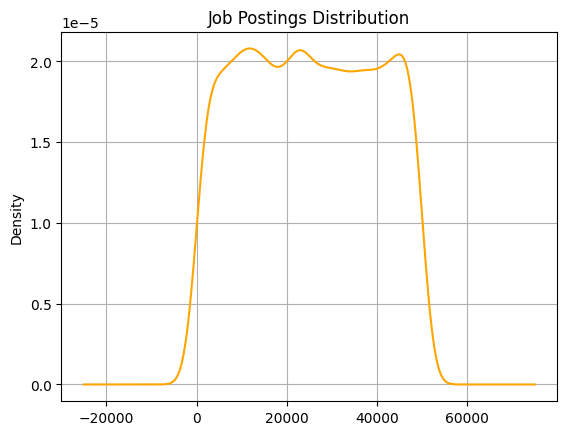

In [47]:
# show the distribution of the single numerical column
df_num.Job_Postings.plot(kind='kde',color='orange')
plt.title('Job Postings Distribution')
plt.grid()
plt.show()

In [48]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### COLLEGE_COUNT

In [50]:
# show the minimum 
df_num.College_Count.min()

np.int64(1)

In [51]:
# show the maximum 
df_num.College_Count.max()

np.int64(99)

In [52]:
# show the Average
df_num.College_Count.mean().round(2)

np.float64(49.61)

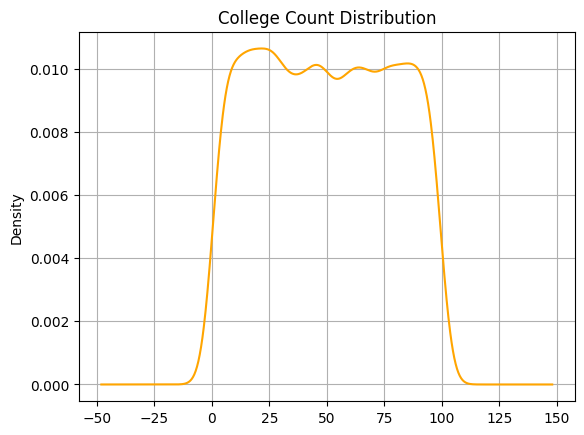

In [53]:
# show the distribution of the single numerical column
df_num.College_Count.plot(kind='kde',color='orange')
plt.title('College Count Distribution')
plt.grid()
plt.show()

In [54]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### SKILL_CENTER_COUNT

In [56]:
# show the minimum 
df_num.Skill_Center_Count.min()

np.int64(1)

In [57]:
# show the maximum 
df_num.Skill_Center_Count.max()

np.int64(49)

In [58]:
# show the Average
df_num.Skill_Center_Count.mean().round(2)

np.float64(25.23)

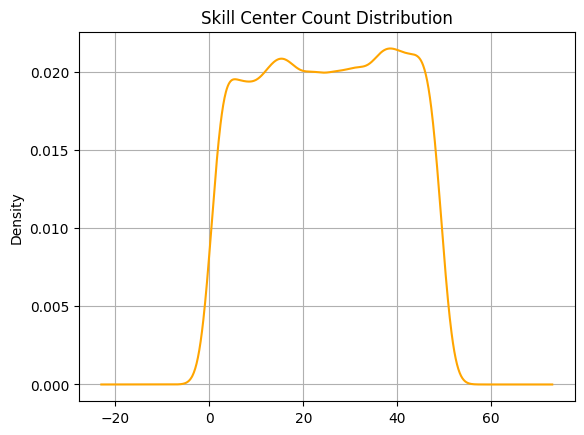

In [59]:
# show the distribution of the single numerical column
df_num.Skill_Center_Count.plot(kind='kde',color='orange')
plt.title('Skill Center Count Distribution')
plt.grid()
plt.show()

In [60]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### GREEN_COVER_PERCENTAGE

In [62]:
# show the minimum 
df_num.Green_Cover_Percentage.min()

np.float64(10.0)

In [63]:
# show the maximum 
df_num.Green_Cover_Percentage.max()

np.float64(60.0)

In [64]:
# show the Average
df_num.Green_Cover_Percentage.mean().round(2)

np.float64(35.12)

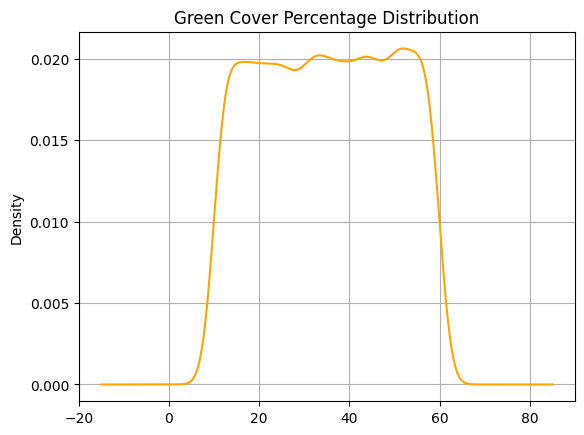

In [65]:
# show the distribution of the single numerical column
df_num.Green_Cover_Percentage.plot(kind='kde',color='orange')
plt.title('Green Cover Percentage Distribution')
plt.grid()
plt.show()

In [66]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### INTERNET_PENETRATION_RATE

In [68]:
# show the minimum 
df_num.Internet_Penetration_Rate.min()

np.float64(40.0)

In [69]:
# show the maximum 
df_num.Internet_Penetration_Rate.max()

np.float64(94.99)

In [70]:
# show the Average
df_num.Internet_Penetration_Rate.mean().round(2)

np.float64(67.43)

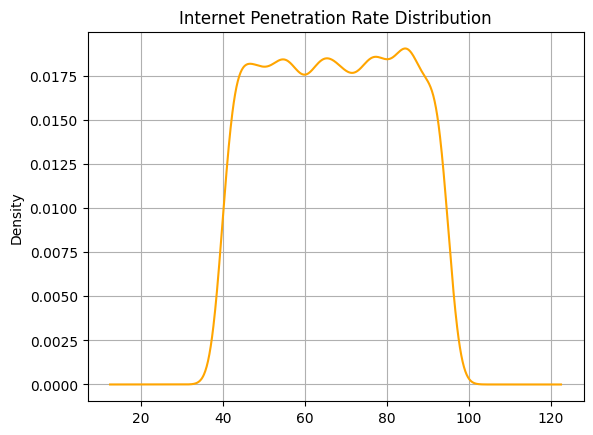

In [71]:
# show the distribution of the single numerical column
df_num.Internet_Penetration_Rate.plot(kind='kde',color='orange')
plt.title('Internet Penetration Rate Distribution')
plt.grid()
plt.show()

In [72]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### STARTUP_COUNT

In [74]:
# show the minimum 
df_num.Startup_Count.min()

np.int64(0)

In [75]:
# show the maximum 
df_num.Startup_Count.max()

np.int64(999)

In [76]:
# show the Average
df_num.Startup_Count.mean().round(2)

np.float64(497.8)

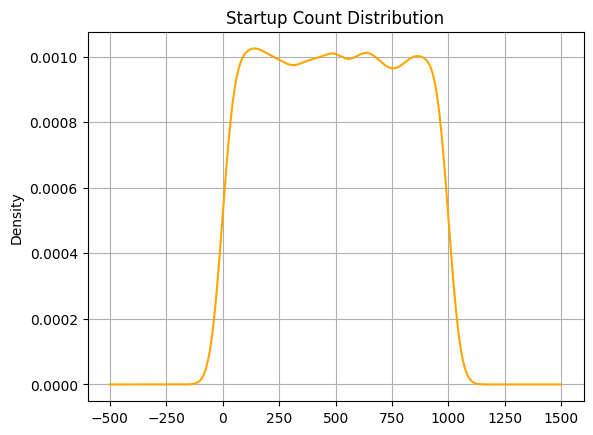

In [77]:
# show the distribution of the single numerical column
df_num.Startup_Count.plot(kind='kde',color='orange')
plt.title('Startup Count Distribution')
plt.grid()
plt.show()

In [78]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### ROAD_CONNECTIVITY_SCORE

In [80]:
# show the minimum 
df_num.Road_Connectivity_Score.min()

np.float64(0.01)

In [81]:
# show the maximum 
df_num.Road_Connectivity_Score.max()

np.float64(100.0)

In [82]:
# show the Average
df_num.Road_Connectivity_Score.mean().round(2)

np.float64(50.12)

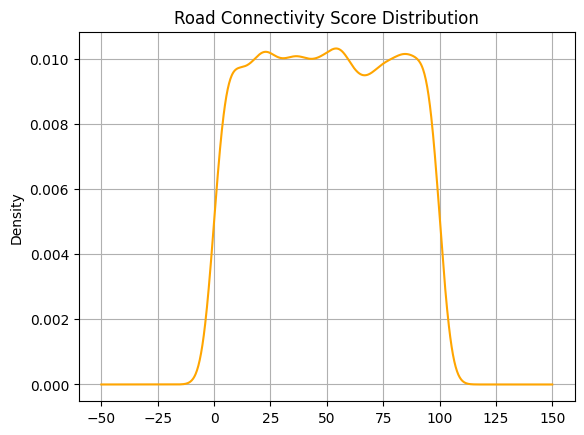

In [83]:
# show the distribution of the single numerical column
df_num.Road_Connectivity_Score.plot(kind='kde',color='orange')
plt.title('Road Connectivity Score Distribution')
plt.grid()
plt.show()

In [84]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### PUBLIC TRANSPORT AVAILABILITY

In [86]:
# show the minimum 
df_num.Public_Transport_Availability.min()

np.float64(0.0)

In [87]:
# show the maximum 
df_num.Public_Transport_Availability.max()

np.float64(99.99)

In [88]:
# show the Average
df_num.Public_Transport_Availability.mean().round(2)

np.float64(49.92)

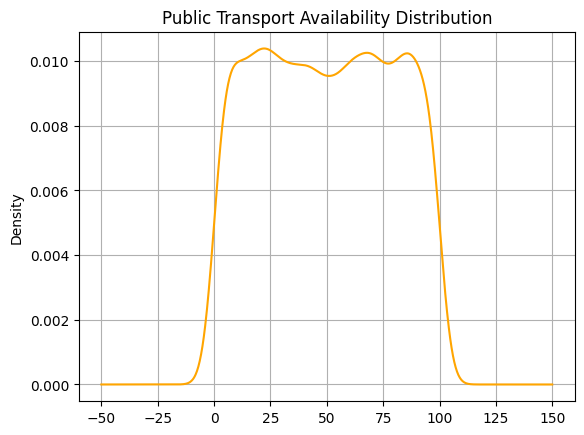

In [89]:
# show the distribution of the single numerical column
df_num.Public_Transport_Availability.plot(kind='kde',color='orange')
plt.title('Public Transport Availability Distribution')
plt.grid()
plt.show()

In [90]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### AFFORDABILITY_INDEX

In [92]:
# show the minimum 
df_num.Affordability_Index.min()

np.float64(0.02)

In [93]:
# show the maximum 
df_num.Affordability_Index.max()

np.float64(99.98)

In [94]:
# show the Average
df_num.Affordability_Index.mean().round(2)

np.float64(50.63)

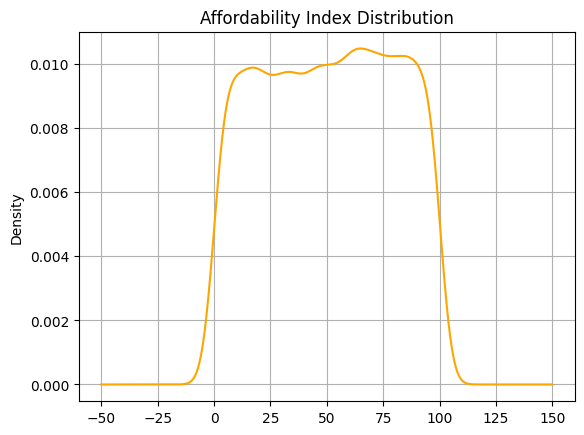

In [95]:
# show the distribution of the single numerical column
df_num.Affordability_Index.plot(kind='kde',color='orange')
plt.title('Affordability Index Distribution')
plt.grid()
plt.show()

#### Perform Univariate Analysis on Categorical Data

In [97]:
# Check the columns present in the categorical data frame
df_cat.columns

Index(['City_Name', 'State'], dtype='object')

#### City_Name

In [99]:
# Check the categories present in the categorical columns
df_cat.City_Name.value_counts()

City_Name
Kozhikode          280
Ujjain             266
Tumkur             263
Udaipur            263
Rohtak             261
Jabalpur           260
Puducherry         257
Agartala           256
Kohima             253
Aizawl             252
Kolhapur           250
Dehradun           250
Panipat            249
Madurai            249
Muzaffarpur        247
Ranchi             246
Hubli              244
Amravati           244
Jalandhar          244
Bhavnagar          244
Aligarh            243
Gwalior            242
Durgapur           241
Kakinada           241
Cuttack            241
Solapur            241
Port Blair         239
Tiruchirappalli    238
Vellore            236
Nellore            235
Tirupati           235
Meerut             234
Salem              233
Thanjavur          233
Saharanpur         232
Gangtok            231
Warangal           230
Vijayawada         229
Shillong           229
Moradabad          227
Bilaspur           227
Jamnagar           227
Rajahmundry        226
S

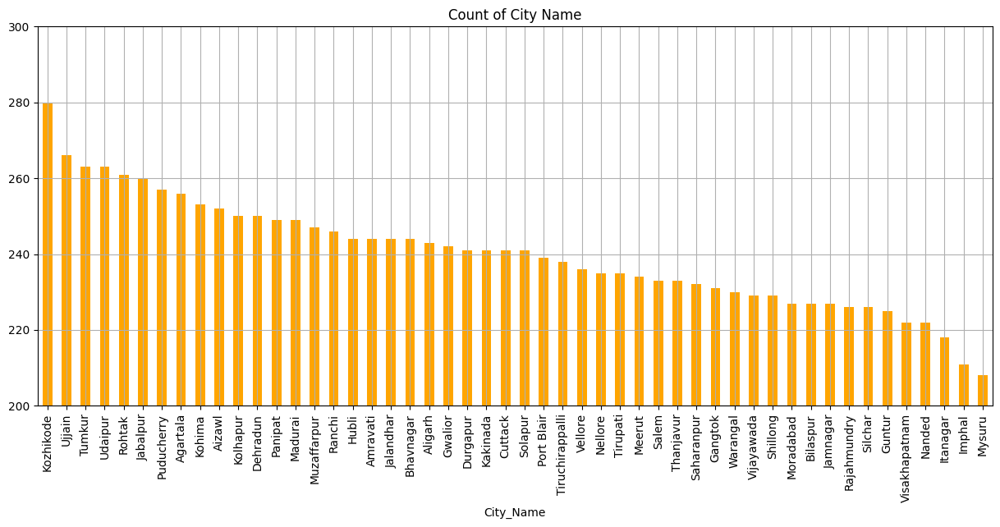

In [100]:
# show the plot
plt.figure(figsize=(15, 6))
df_cat.City_Name.value_counts().plot(kind='bar',color='orange')
plt.title('Count of City Name') 
plt.xticks(rotation = 90)
plt.ylim(200, 300)
plt.grid()
plt.show()

In [101]:
# Check the columns present in the categorical data frame
df_cat.columns

Index(['City_Name', 'State'], dtype='object')

#### State

In [103]:
# Check the categories present in the categorical columns
df_cat.State.value_counts()

State
Andhra Pradesh                 1613
Tamil Nadu                     1189
Maharashtra                     957
Uttar Pradesh                   936
Madhya Pradesh                  768
Karnataka                       715
Haryana                         510
Gujarat                         471
Kerala                          280
Rajasthan                       263
Puducherry                      257
Tripura                         256
Nagaland                        253
Mizoram                         252
Uttarakhand                     250
Bihar                           247
Jharkhand                       246
Punjab                          244
Odisha                          241
West Bengal                     241
Andaman and Nicobar Islands     239
Sikkim                          231
Telangana                       230
Meghalaya                       229
Chhattisgarh                    227
Assam                           226
Arunachal Pradesh               218
Manipur               

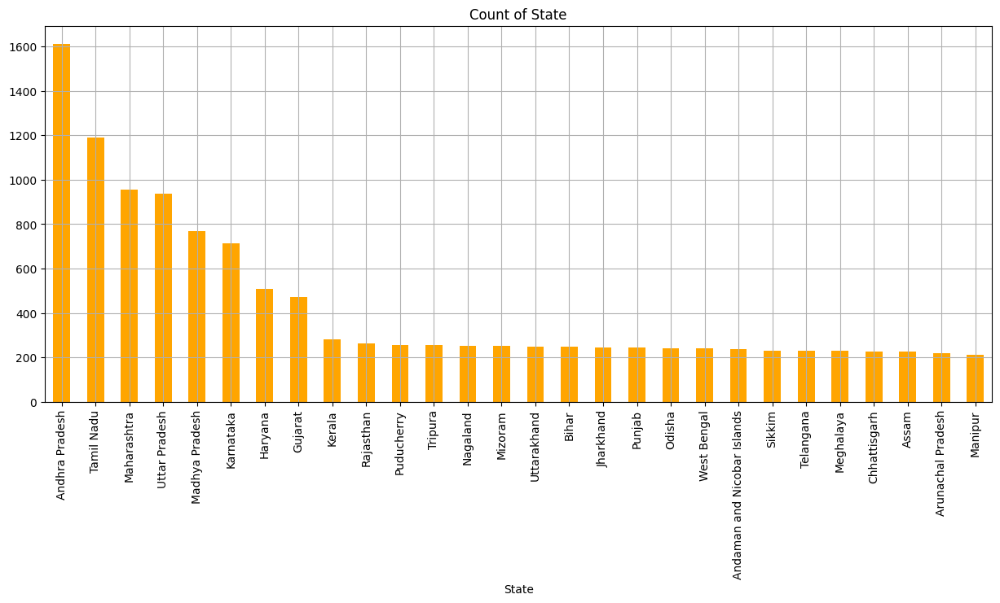

In [104]:
# show the plot
plt.figure(figsize=(15, 6))
df_cat.State.value_counts().plot(kind='bar',color='orange')
plt.title('Count of State') 
plt.xticks(rotation = 90)
plt.grid()
plt.show()

### Bivariate Analysis

In [106]:
# show the first 5 observations of the main data
df_city_growth_dataset.head()

,City_Name,State,Year,Population,Job_Postings,College_Count,Skill_Center_Count,Green_Cover_Percentage,Internet_Penetration_Rate,Startup_Count,Road_Connectivity_Score,Public_Transport_Availability,Affordability_Index,Opportunity_Access_Score
0,Panipat,Haryana,2023,231932,38158,72,21,17.80,48.58,330,45.92,33.37,14.29,65.09
1,Visakhapatnam,Andhra Pradesh,2023,427069,2433,64,21,40.87,73.64,252,43.19,29.12,61.19,13.95
2,Solapur,Maharashtra,2023,748143,189,62,47,40.92,61.04,243,59.24,4.65,60.75,17.05
3,Panipat,Haryana,2021,765987,8792,60,14,50.42,56.75,564,23.09,24.10,68.33,61.00
4,Hubli,Karnataka,2022,704365,35920,36,40,47.77,63.38,565,54.67,18.49,96.96,77.51


In [107]:
# correlation matrix of the numerical data
df_num.corr()

,Year,Population,Job_Postings,College_Count,Skill_Center_Count,Green_Cover_Percentage,Internet_Penetration_Rate,Startup_Count,Road_Connectivity_Score,Public_Transport_Availability,Affordability_Index,Opportunity_Access_Score
Year,1.000000,-0.011970,-0.004231,0.010758,-0.002307,0.011420,0.007097,0.004909,-0.014206,-0.012362,-0.002483,0.010570
Population,-0.011970,1.000000,0.004581,-0.012526,0.010276,-0.007869,-0.010437,0.004020,0.009156,0.001740,-0.010770,-0.007114
Job_Postings,-0.004231,0.004581,1.000000,0.022043,0.002035,0.022831,0.001639,-0.011849,-0.006062,0.004054,0.000632,-0.002850
College_Count,0.010758,-0.012526,0.022043,1.000000,0.003062,-0.006628,-0.015223,-0.007043,-0.009638,0.007173,-0.010549,-0.005091
Skill_Center_Count,-0.002307,0.010276,0.002035,0.003062,1.000000,0.003959,-0.001502,-0.010572,-0.001817,-0.000150,-0.006266,-0.013853
Green_Cover_Percentage,0.011420,-0.007869,0.022831,-0.006628,0.003959,1.000000,0.003975,-0.005573,-0.016151,0.001257,-0.003969,-0.012340
Internet_Penetration_Rate,0.007097,-0.010437,0.001639,-0.015223,-0.001502,0.003975,1.000000,0.011786,0.003779,-0.006796,0.003448,0.000960
Startup_Count,0.004909,0.004020,-0.011849,-0.007043,-0.010572,-0.005573,0.011786,1.000000,-0.004696,0.001307,-0.014426,-0.005719
Road_Connectivity_Score,-0.014206,0.009156,-0.006062,-0.009638,-0.001817,-0.016151,0.003779,-0.004696,1.000000,-0.013474,0.023568,-0.014391
Public_Transport_Availability,-0.012362,0.001740,0.004054,0.007173,-0.000150,0.001257,-0.006796,0.001307,-0.013474,1.000000,0.012298,-0.001973


**Interpretation**
 - We do not have any correlated numerical columns.

#### Bivariate Analysis on 1 Numerical and 1 Categorical Column

In [110]:
# show the categorical columns
df_cat.columns

Index(['City_Name', 'State'], dtype='object')

In [111]:
# show the numerical columns
df_num.columns

Index(['Year', 'Population', 'Job_Postings', 'College_Count',
       'Skill_Center_Count', 'Green_Cover_Percentage',
       'Internet_Penetration_Rate', 'Startup_Count', 'Road_Connectivity_Score',
       'Public_Transport_Availability', 'Affordability_Index',
       'Opportunity_Access_Score'],
      dtype='object')

#### City_Name, Year

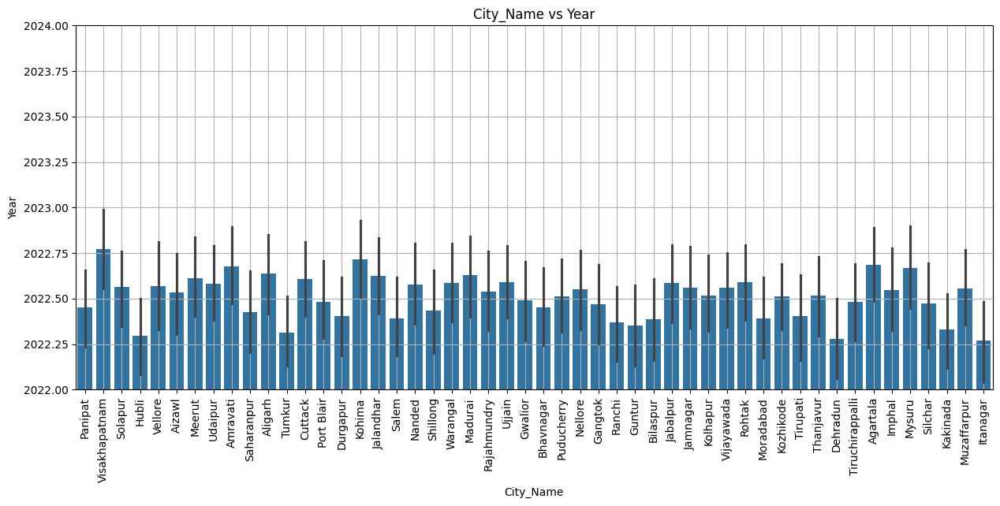

In [113]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Year',data = df_city_growth_dataset)
plt.title('City_Name vs Year')
plt.xticks(rotation = 90)
plt.ylim(2022, 2024)
plt.grid()
plt.show()

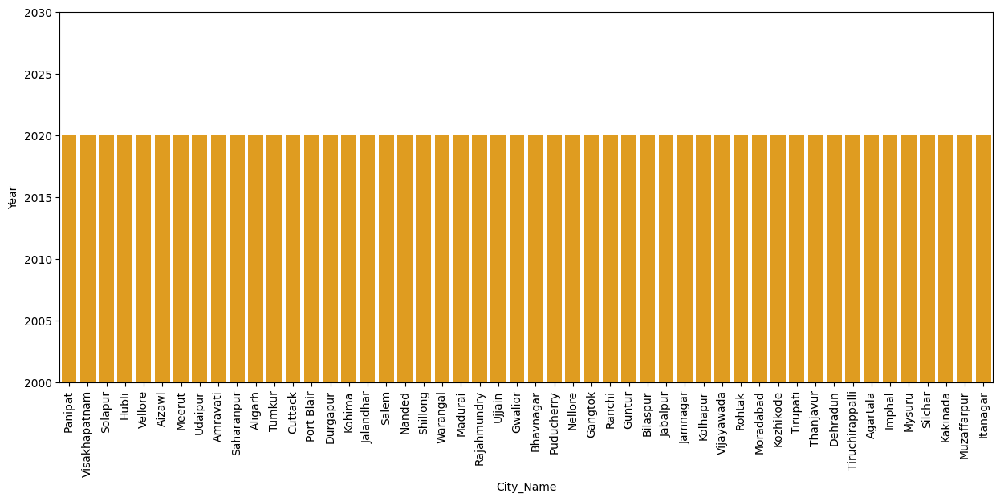

In [114]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Year',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.ylim(2000, 2030)
plt.show()

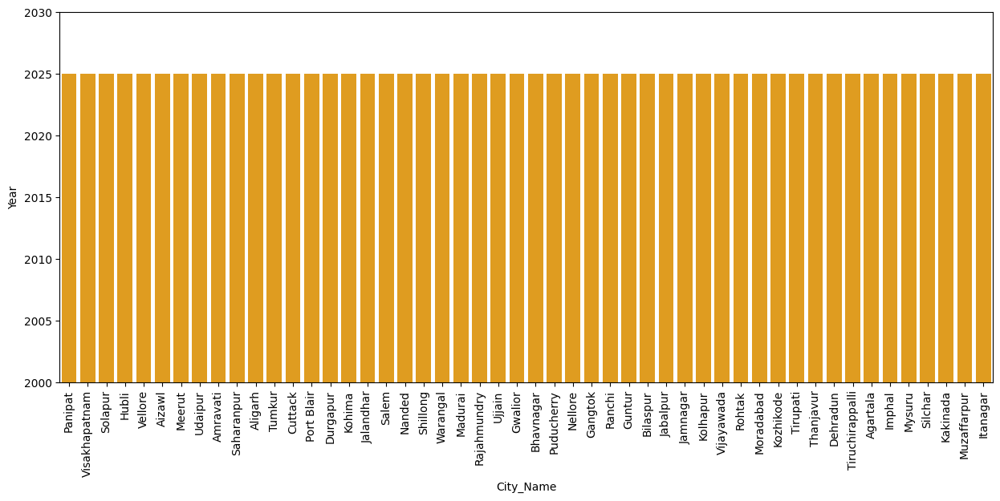

In [115]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Year',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(2000, 2030)
plt.show()

#### State, Year

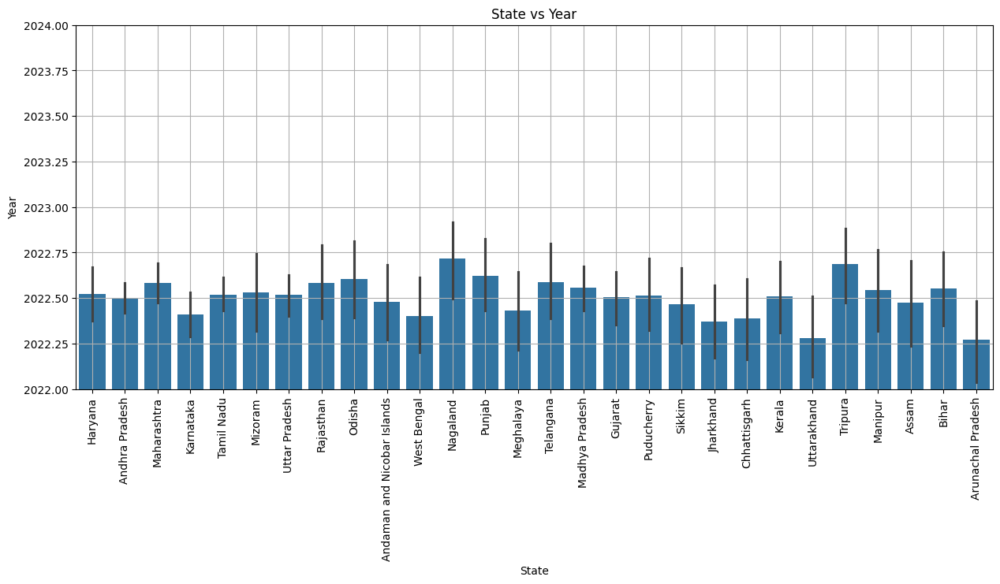

In [117]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Year',data = df_city_growth_dataset)
plt.title('State vs Year')
plt.xticks(rotation = 90)
plt.ylim(2022, 2024)
plt.grid()
plt.show()

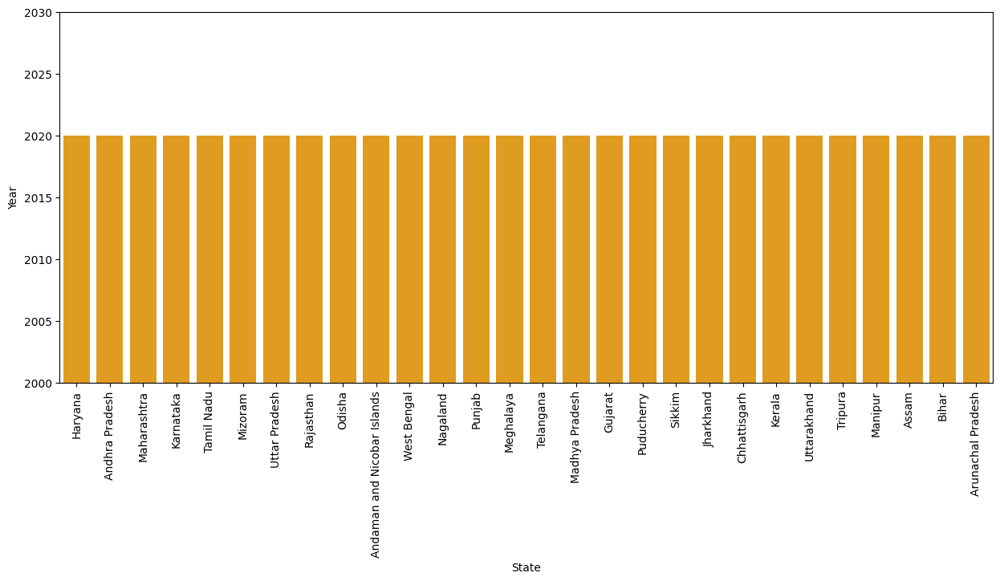

In [118]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Year',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.ylim(2000,2030)
plt.show()

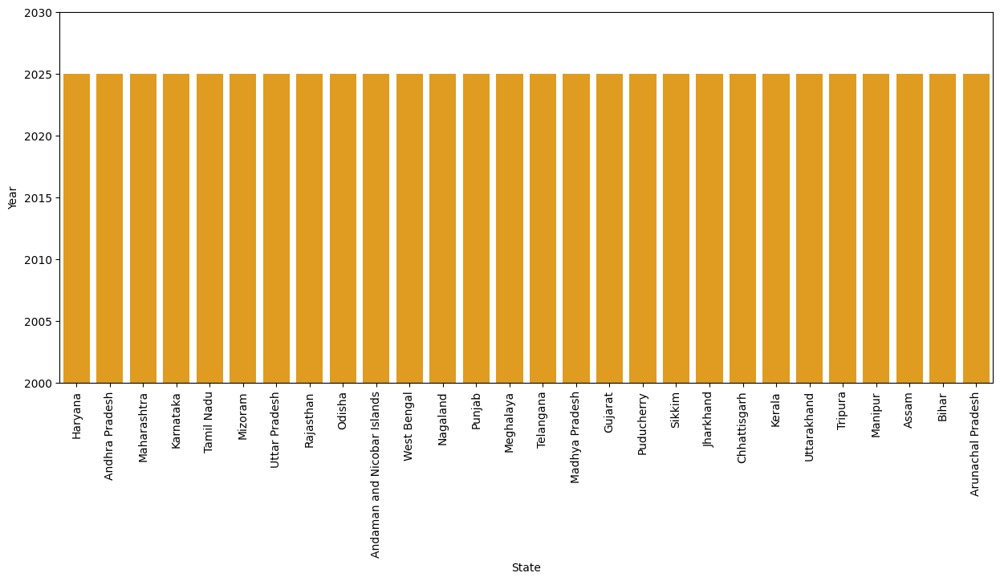

In [119]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Year',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(2000, 2030)
plt.show()

#### City_Name, Population

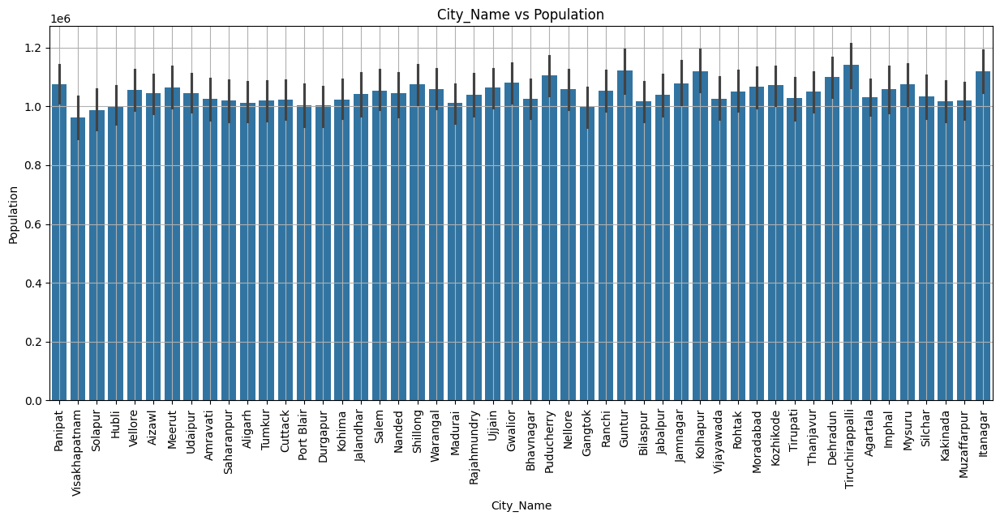

In [121]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Population',data = df_city_growth_dataset)
plt.title('City_Name vs Population')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

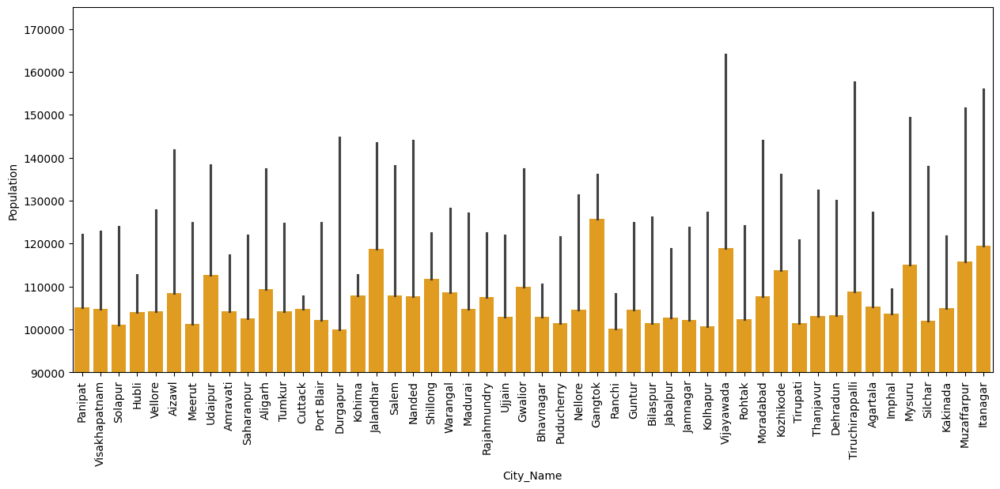

In [122]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Population',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.ylim(90000, 175000)
plt.show()

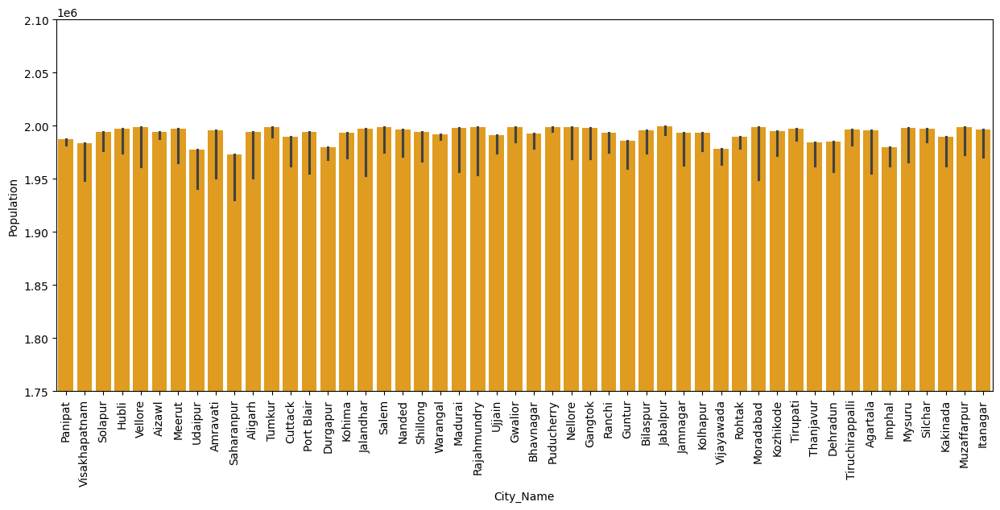

In [123]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Population',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(1750000, 2100000)
plt.show()

#### State, Population

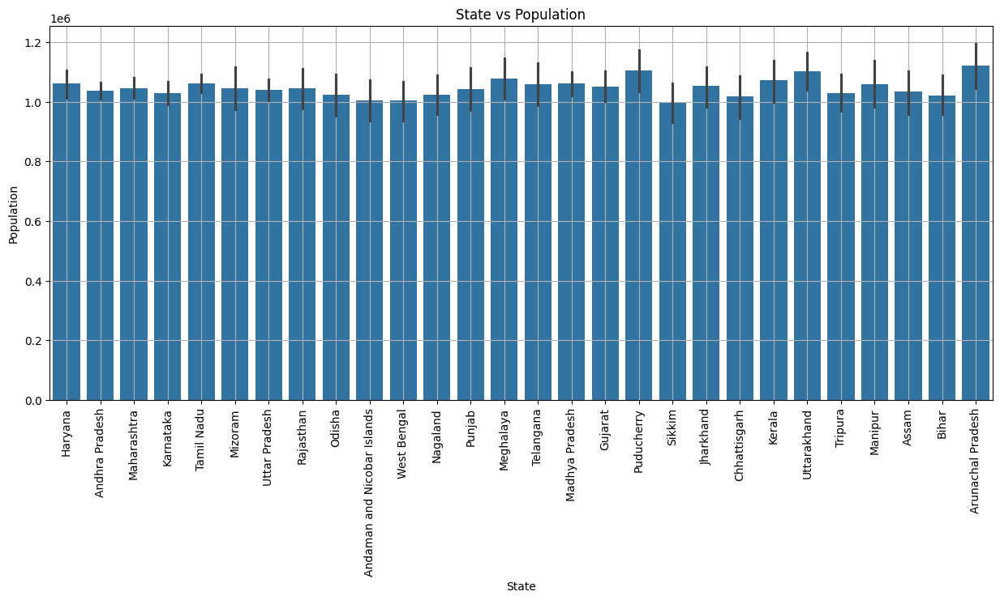

In [125]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Population',data = df_city_growth_dataset)
plt.title('State vs Population')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

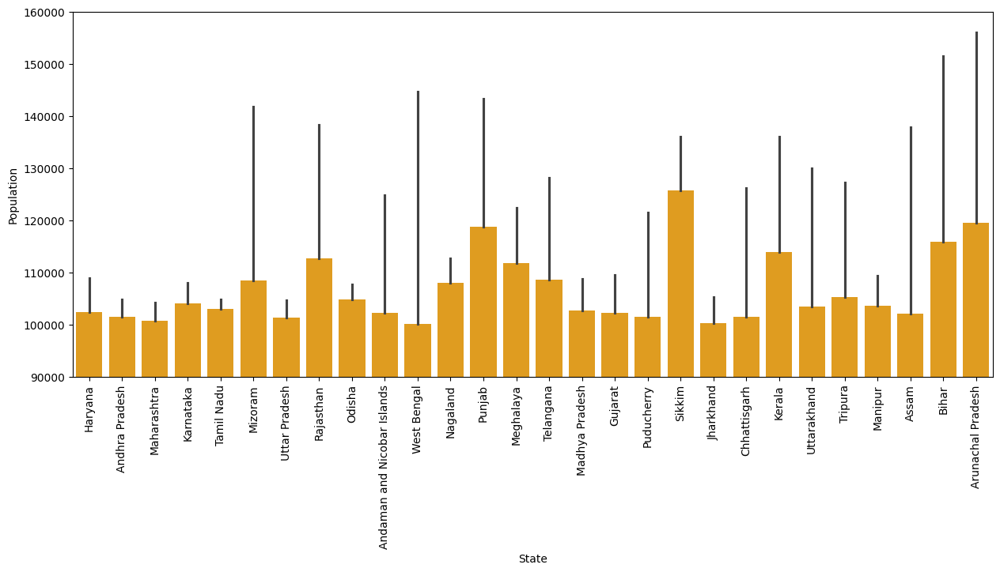

In [126]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Population',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.ylim(90000, 160000)
plt.show()

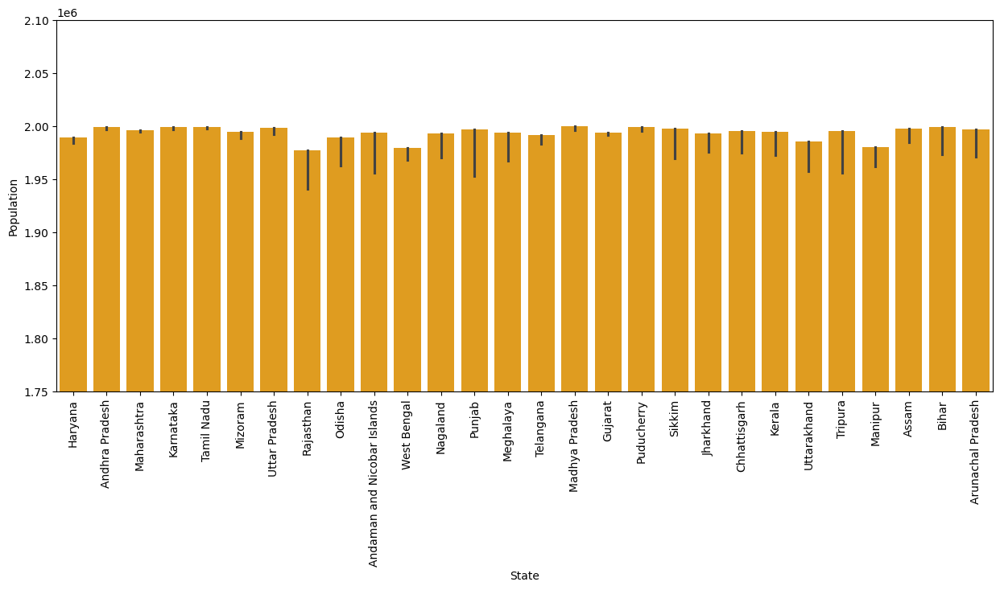

In [127]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Population',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(1750000, 2100000)
plt.show()

#### City_Name, Job_Postings

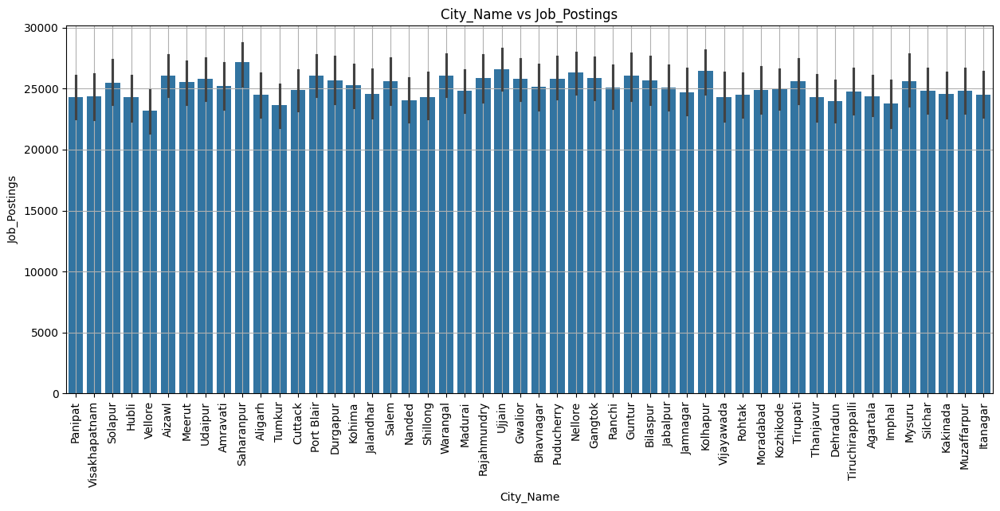

In [129]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Job_Postings',data = df_city_growth_dataset)
plt.title('City_Name vs Job_Postings')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

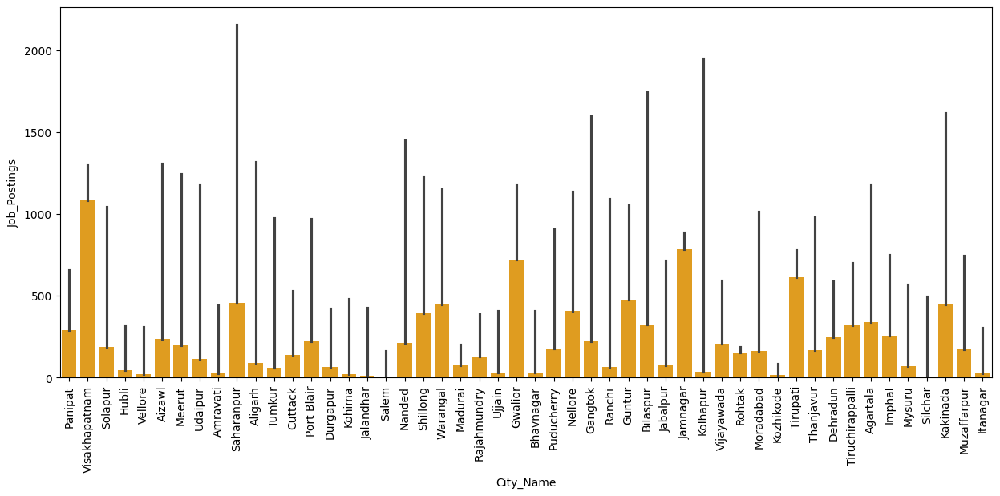

In [130]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Job_Postings',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show()

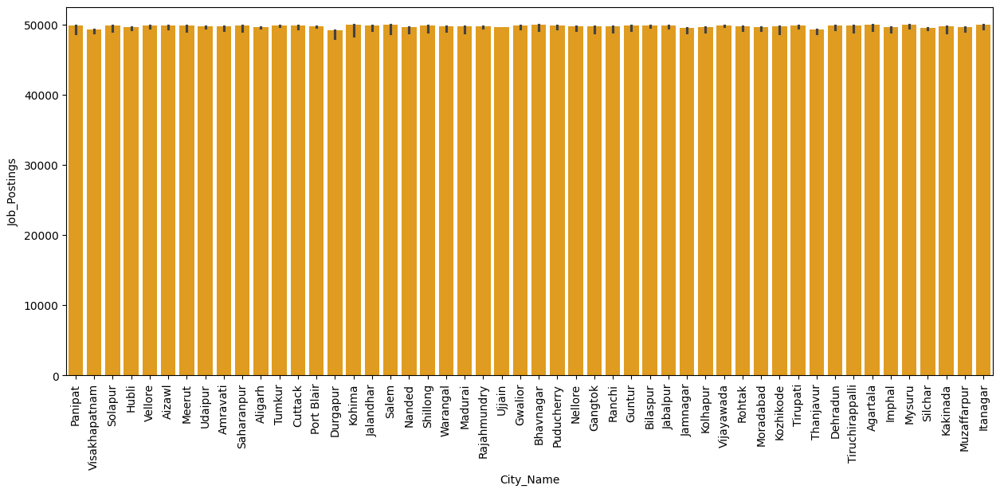

In [131]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Job_Postings',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.show()

#### State, Job_Postings

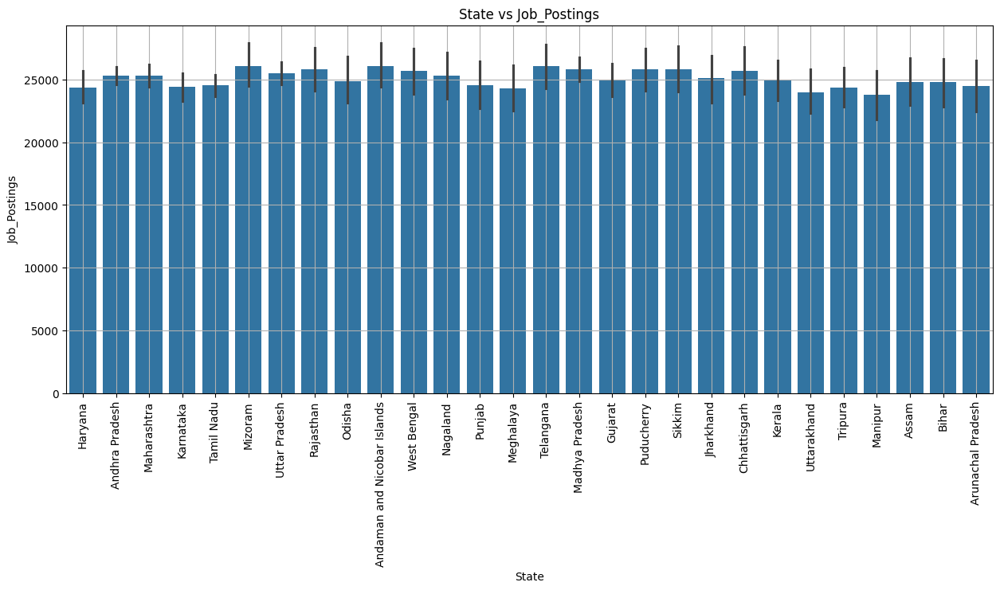

In [133]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Job_Postings',data = df_city_growth_dataset)
plt.title('State vs Job_Postings')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

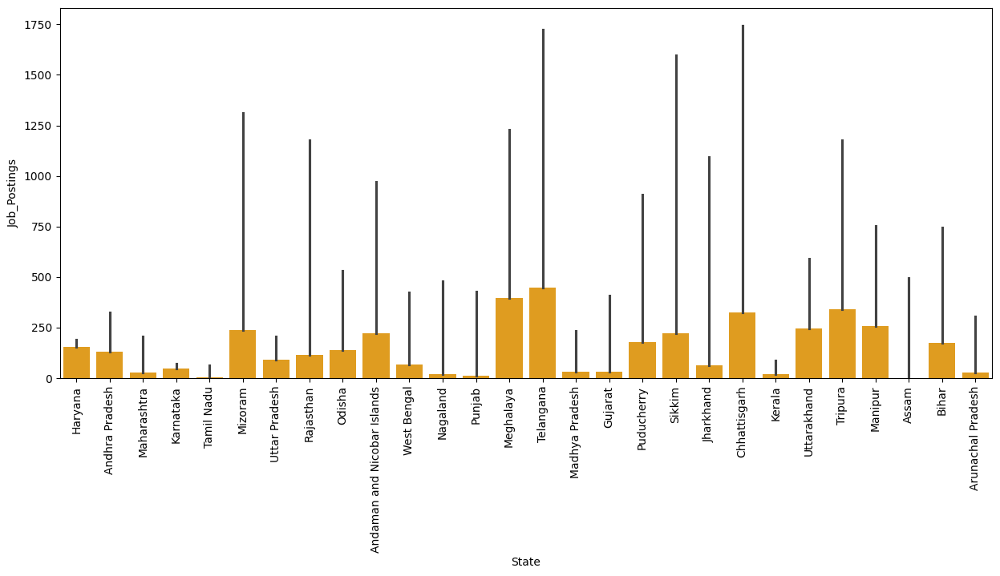

In [134]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Job_Postings',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show()

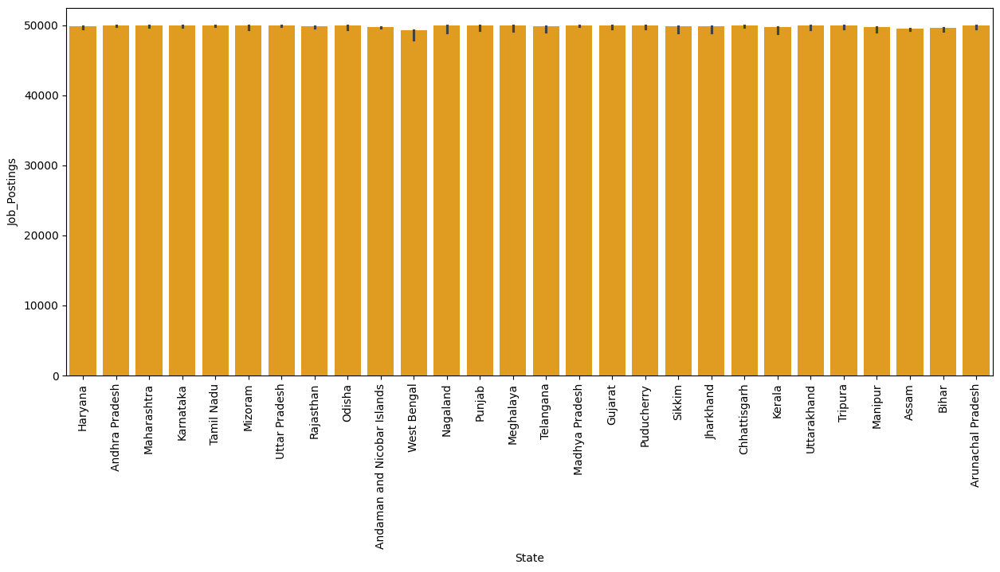

In [135]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Job_Postings',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.show()

#### City_Name, College_Count

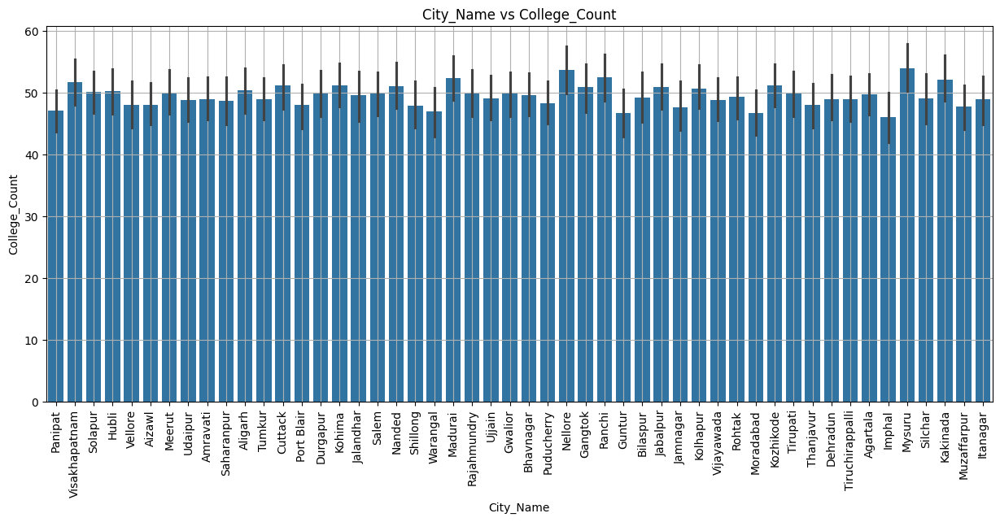

In [137]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='College_Count',data = df_city_growth_dataset)
plt.title('City_Name vs College_Count')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

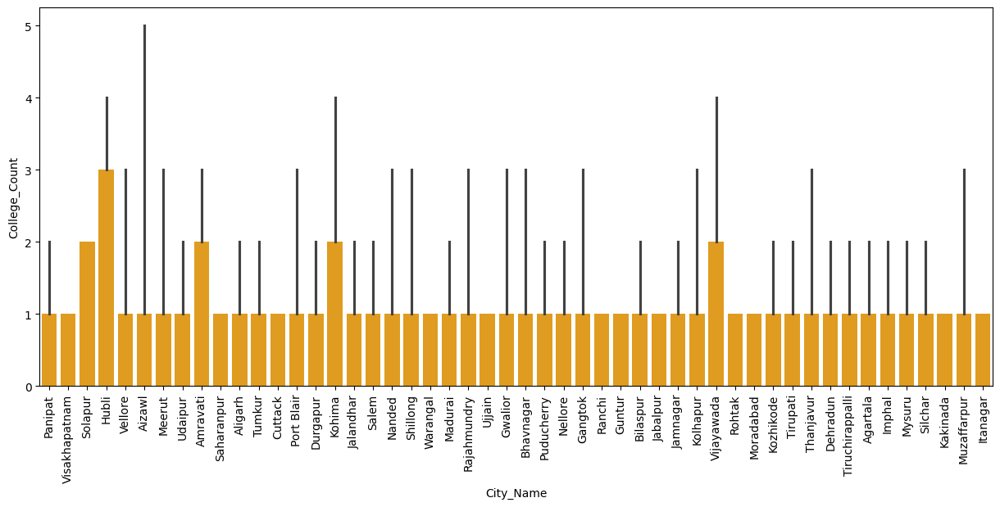

In [138]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='College_Count',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show()

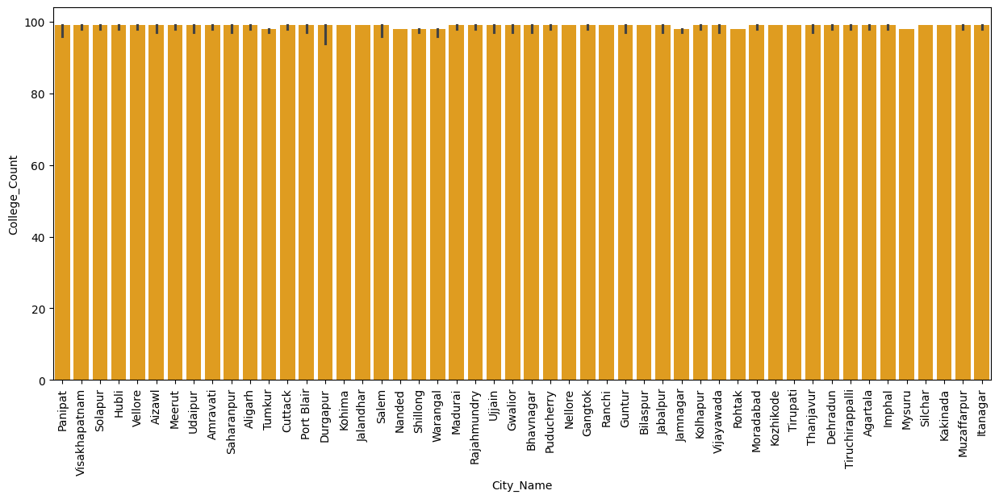

In [139]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='College_Count',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.show()

#### State, College_Count

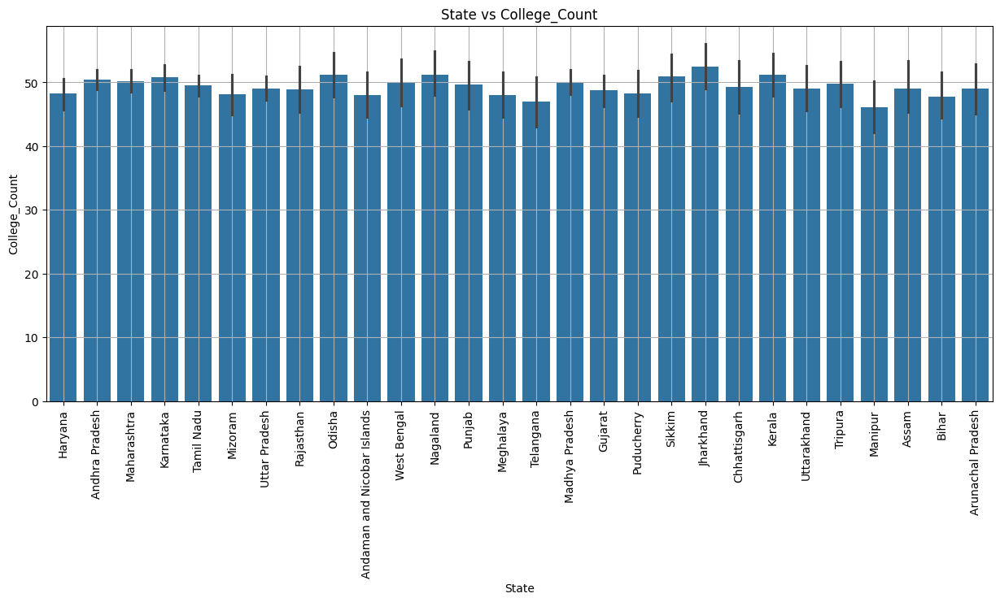

In [141]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='College_Count',data = df_city_growth_dataset)
plt.title('State vs College_Count')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

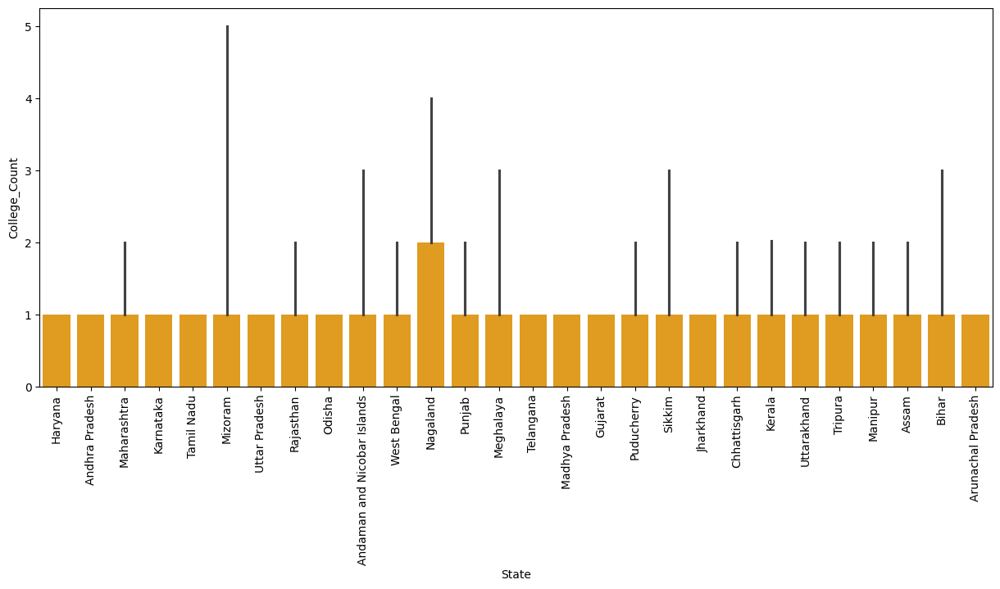

In [142]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='College_Count',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show()

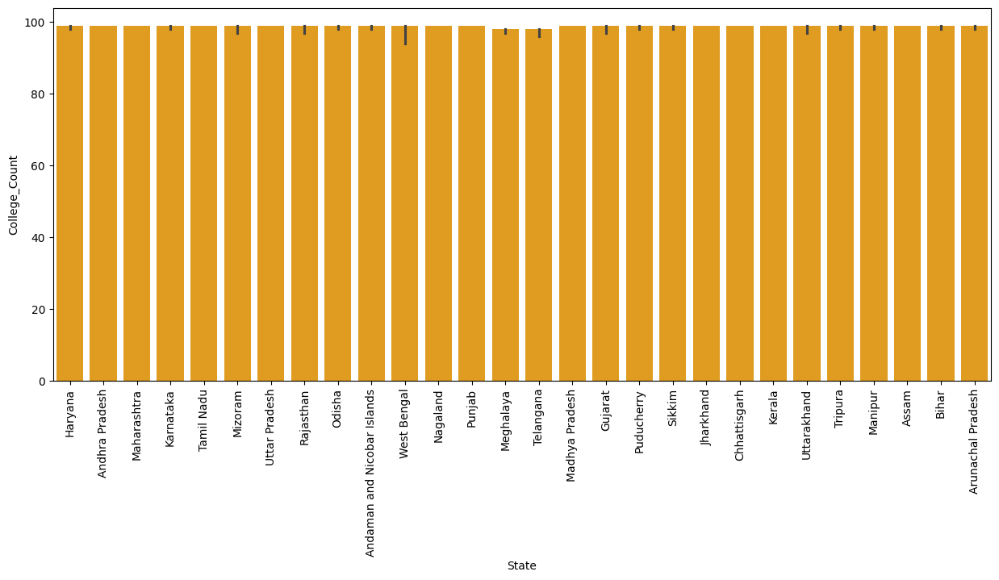

In [143]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='College_Count',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.show()

#### City_Name, Skill_Center_Count

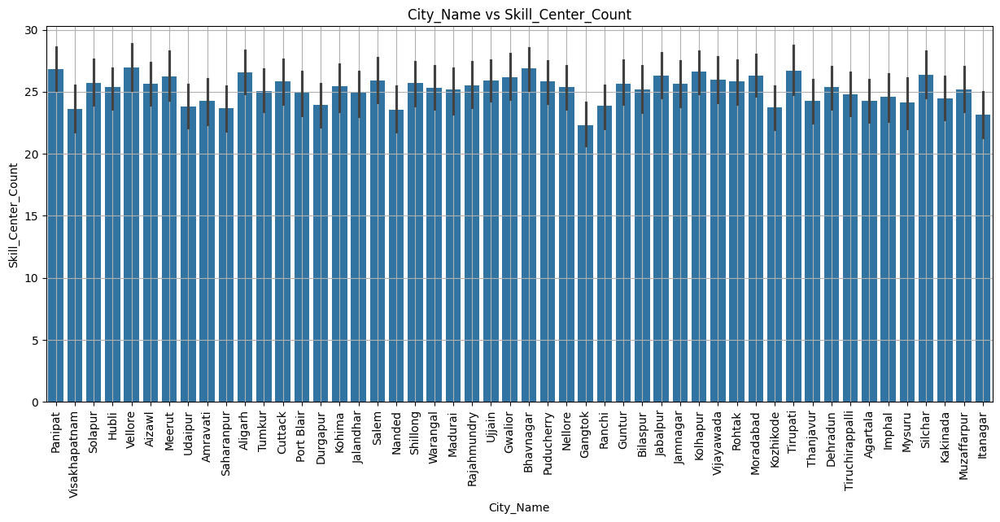

In [145]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Skill_Center_Count',data = df_city_growth_dataset)
plt.title('City_Name vs Skill_Center_Count')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

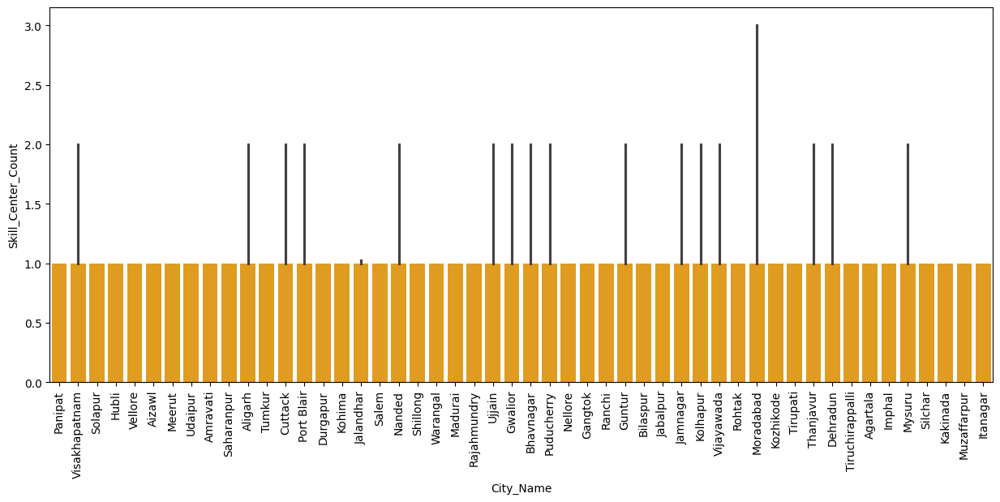

In [146]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Skill_Center_Count',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

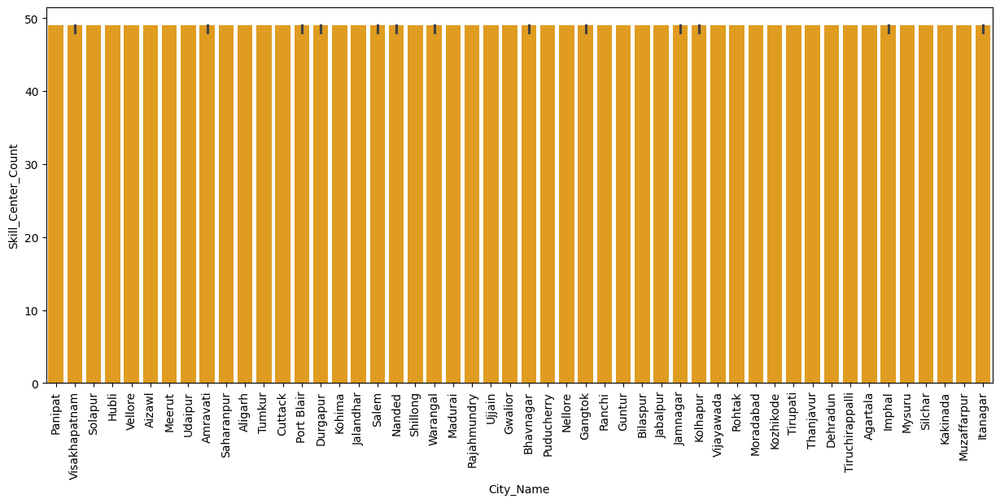

In [147]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Skill_Center_Count',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.show

#### State, Skill_Center_Count

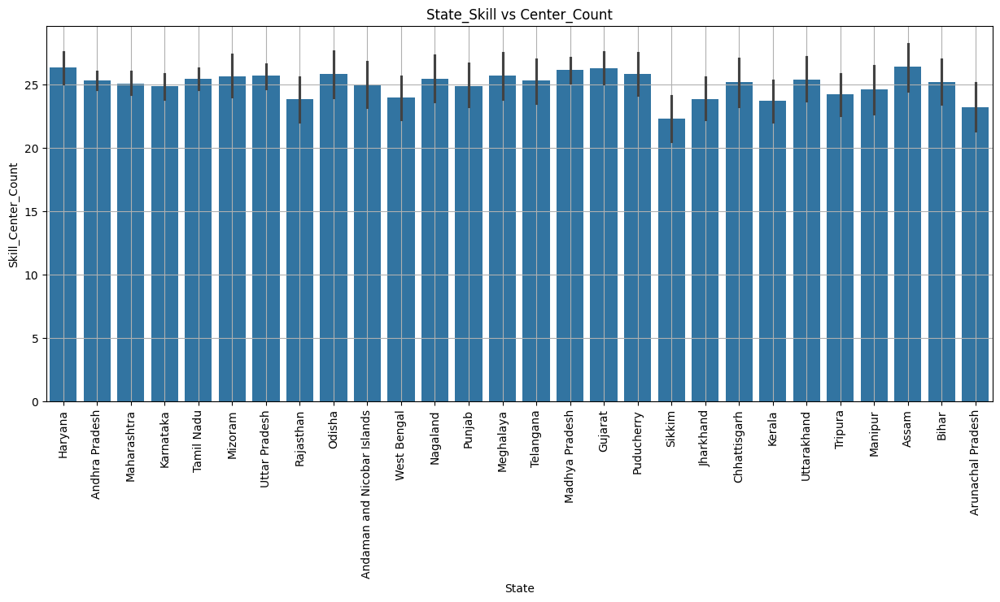

In [149]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Skill_Center_Count',data = df_city_growth_dataset)
plt.title('State_Skill vs Center_Count')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

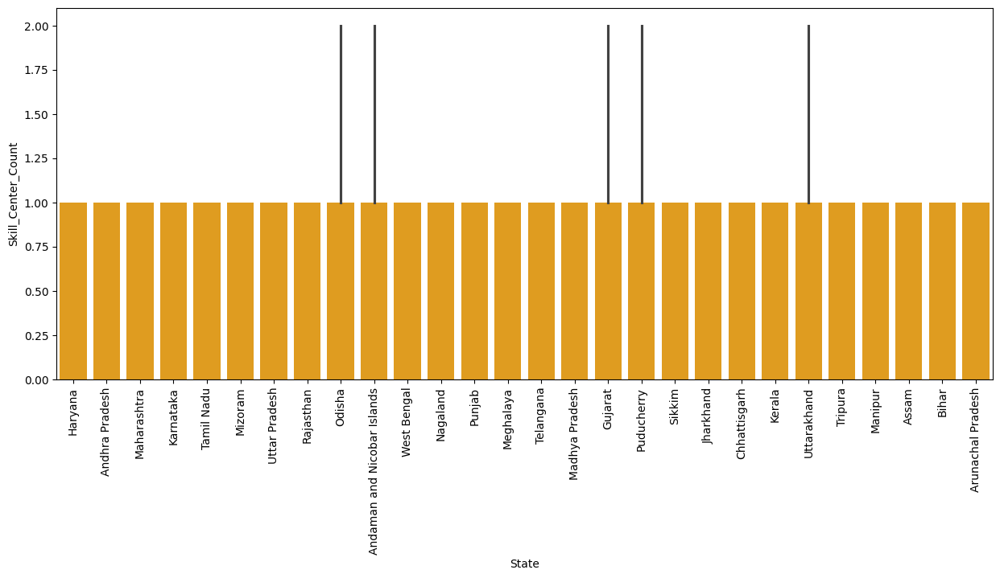

In [150]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Skill_Center_Count',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show()

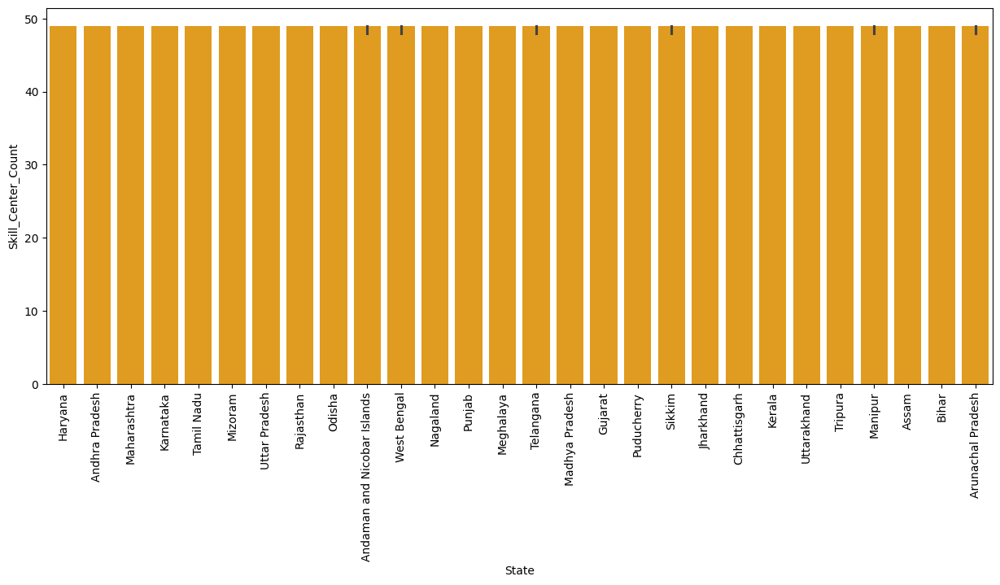

In [151]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Skill_Center_Count',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.show()

#### City_Name, Green_Cover_Percentage

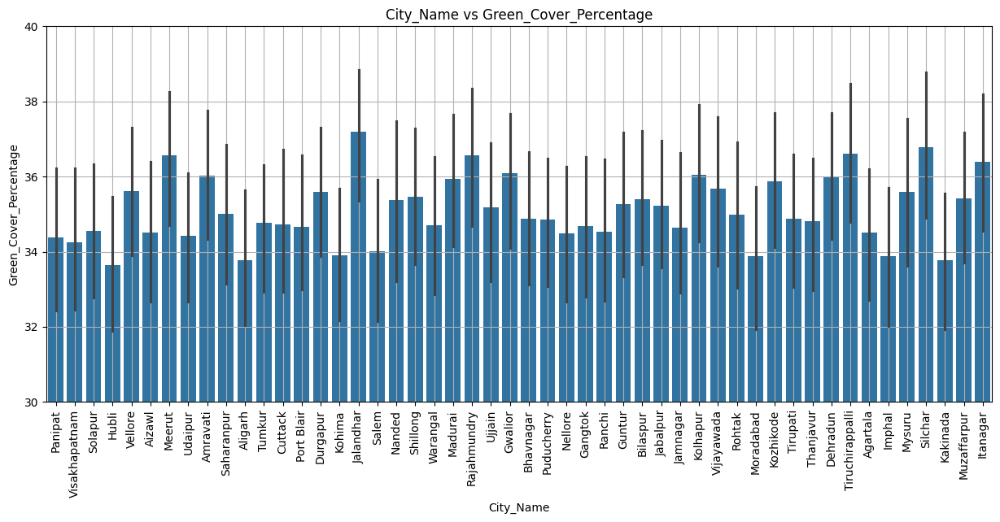

In [153]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Green_Cover_Percentage',data = df_city_growth_dataset)
plt.title('City_Name vs Green_Cover_Percentage')
plt.xticks(rotation = 90)
plt.ylim(30, 40)
plt.grid()
plt.show()

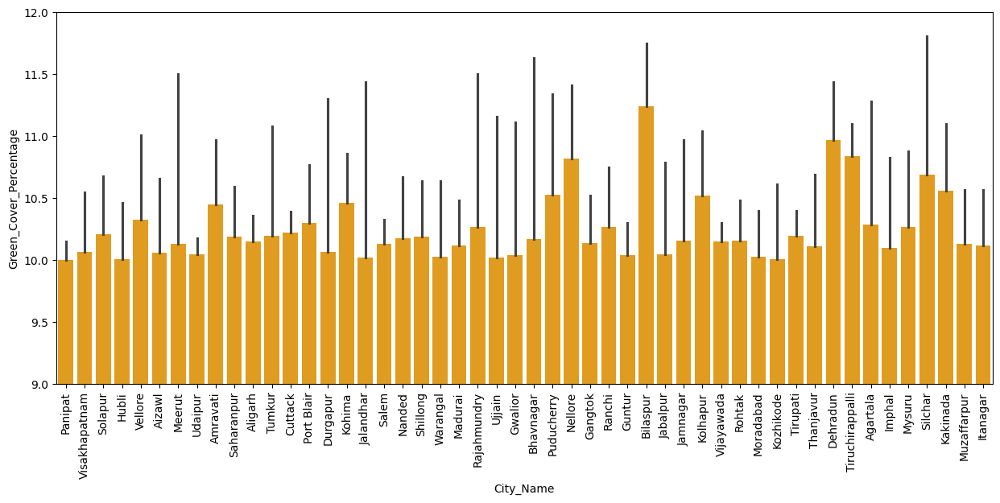

In [154]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Green_Cover_Percentage',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.ylim(9, 12)
plt.show()

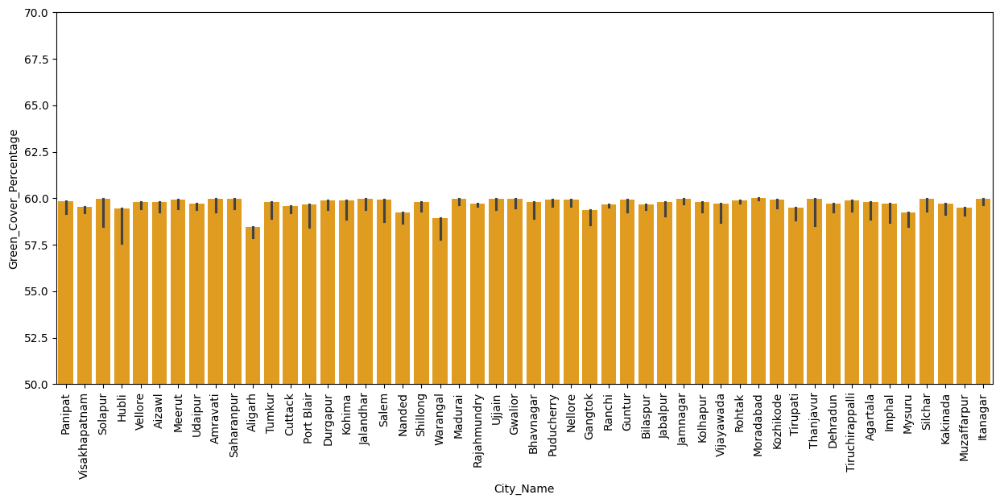

In [155]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Green_Cover_Percentage',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(50, 70)
plt.show()

#### State, Green_Cover_Percentage

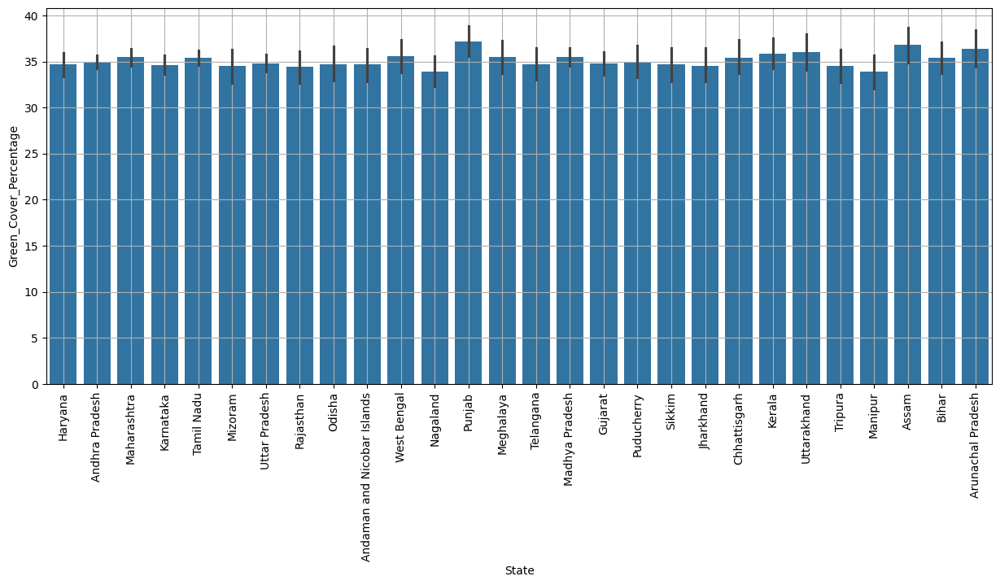

In [157]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Green_Cover_Percentage',data = df_city_growth_dataset)
plt.xticks(rotation = 90)
plt.grid()
plt.show()

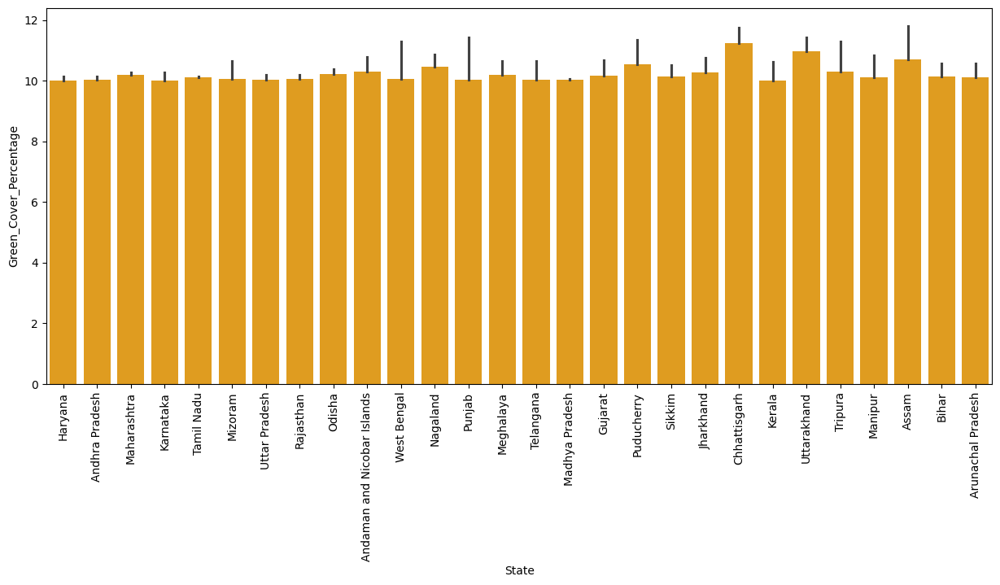

In [158]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Green_Cover_Percentage',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show()

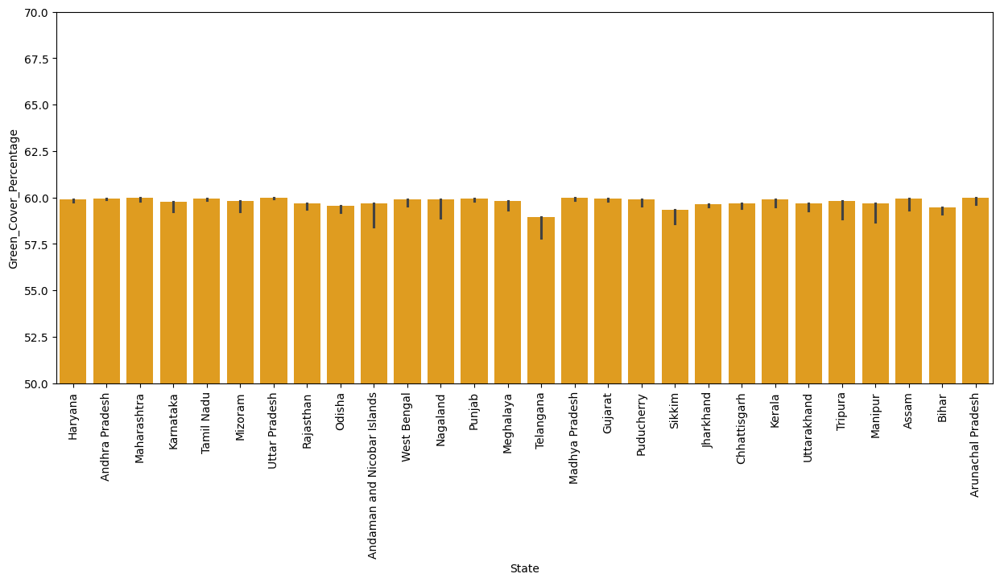

In [159]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Green_Cover_Percentage',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(50, 70)
plt.show()

#### City_Name, Internet_Penetration_Rate

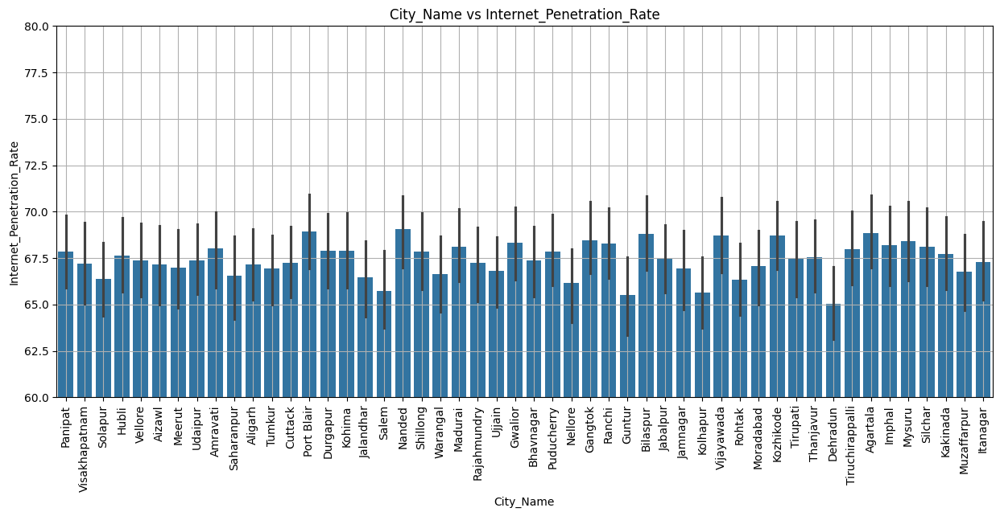

In [161]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Internet_Penetration_Rate',data = df_city_growth_dataset)
plt.title('City_Name vs Internet_Penetration_Rate')
plt.xticks(rotation = 90)
plt.ylim(60, 80)
plt.grid()
plt.show()

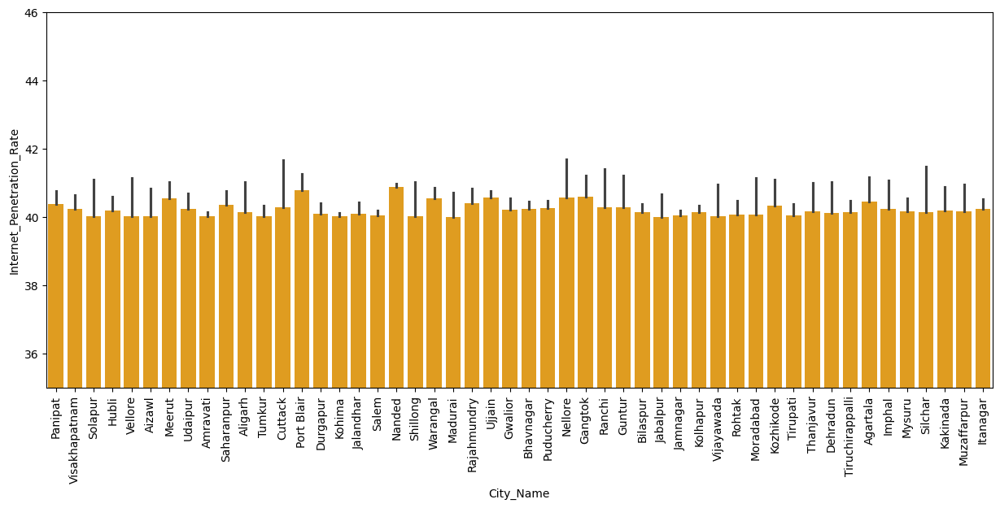

In [162]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Internet_Penetration_Rate',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.ylim(35, 46)
plt.show()

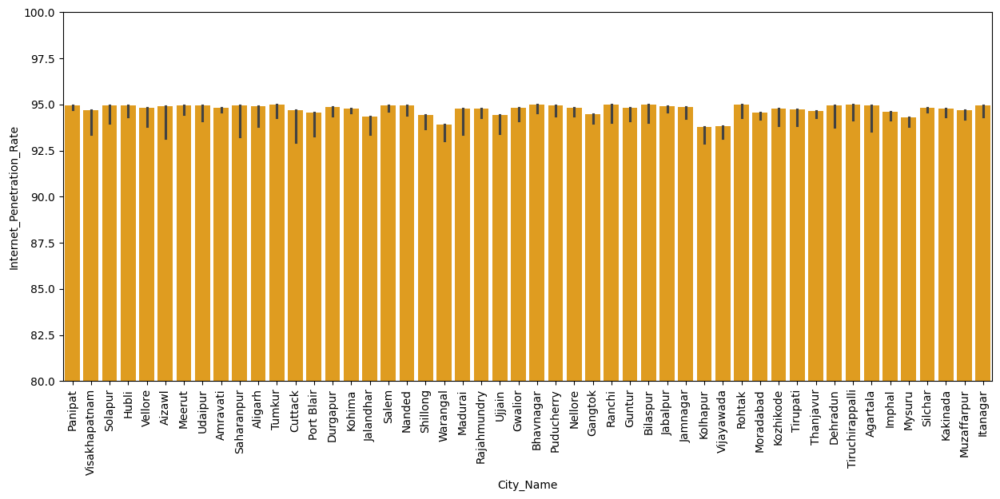

In [163]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Internet_Penetration_Rate',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(80, 100)
plt.show()

#### State, Internet_Penetration_Rate

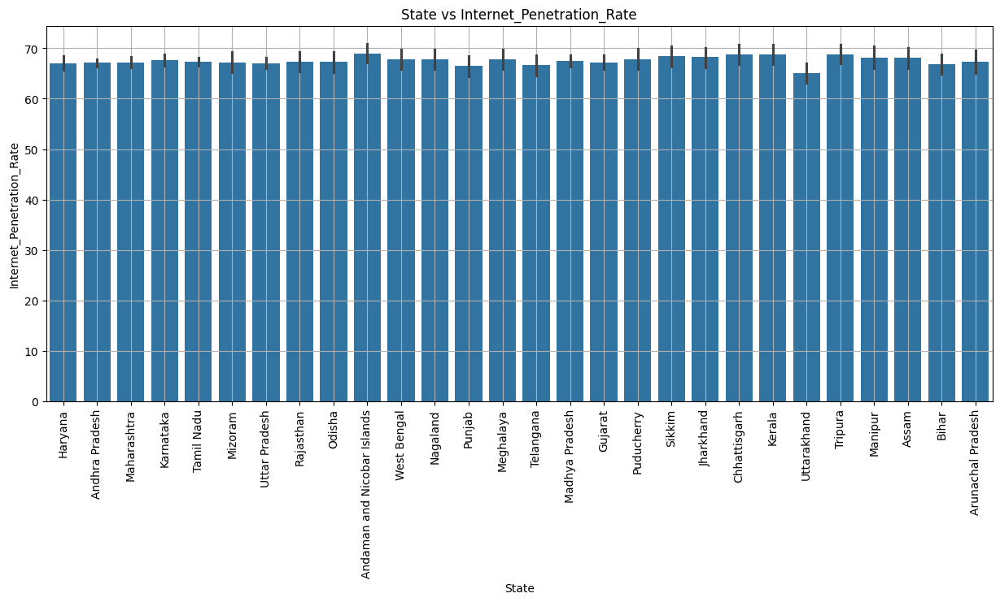

In [165]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Internet_Penetration_Rate',data = df_city_growth_dataset)
plt.title('State vs Internet_Penetration_Rate')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

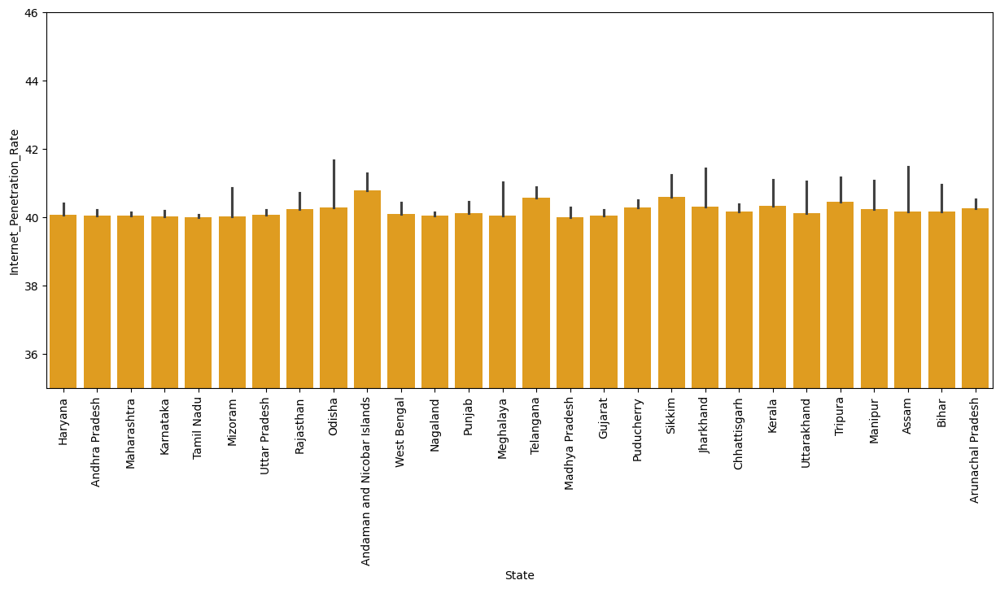

In [166]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Internet_Penetration_Rate',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.ylim(35, 46)
plt.show()

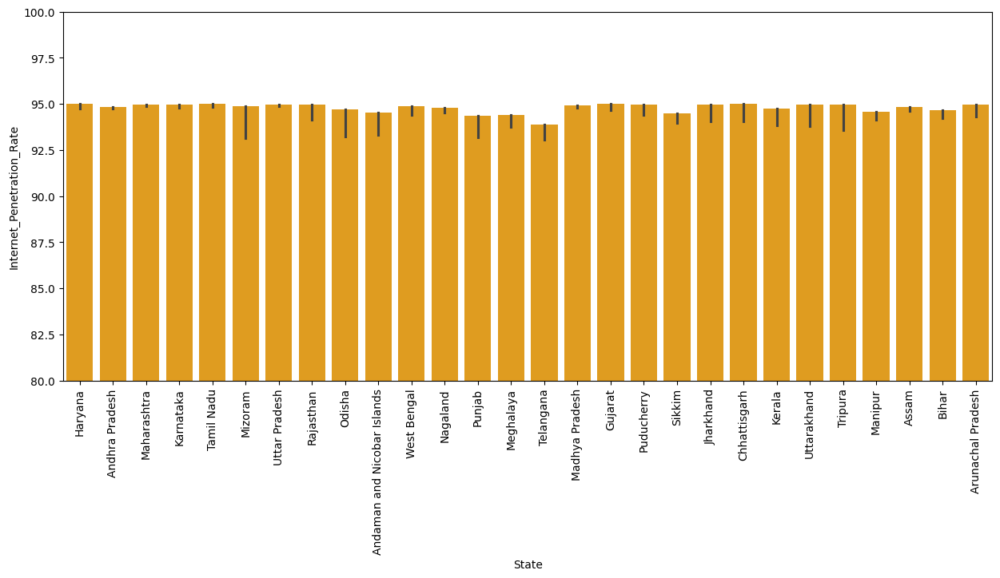

In [167]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Internet_Penetration_Rate',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(80, 100)
plt.show()

#### City_Name, Startup_Count

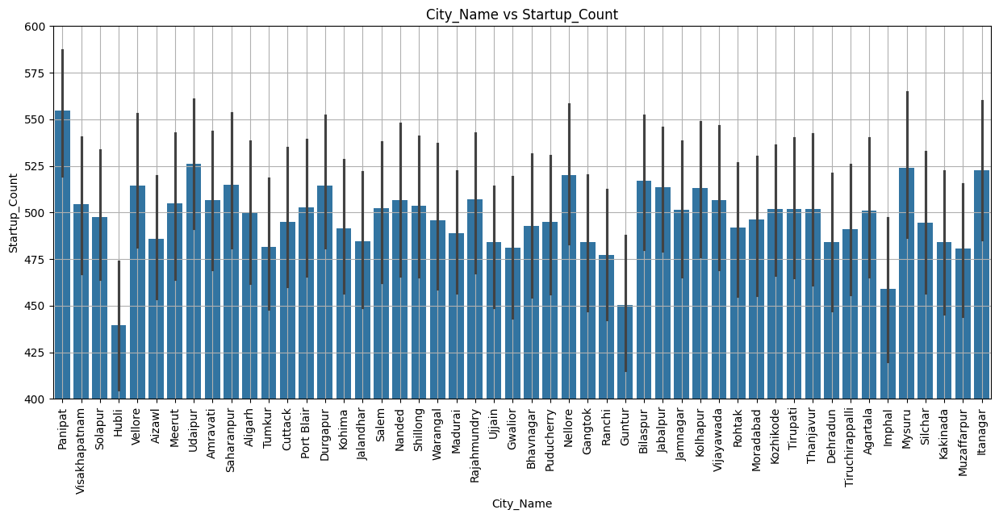

In [169]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Startup_Count',data = df_city_growth_dataset)
plt.title('City_Name vs Startup_Count')
plt.xticks(rotation = 90)
plt.ylim(400, 600)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

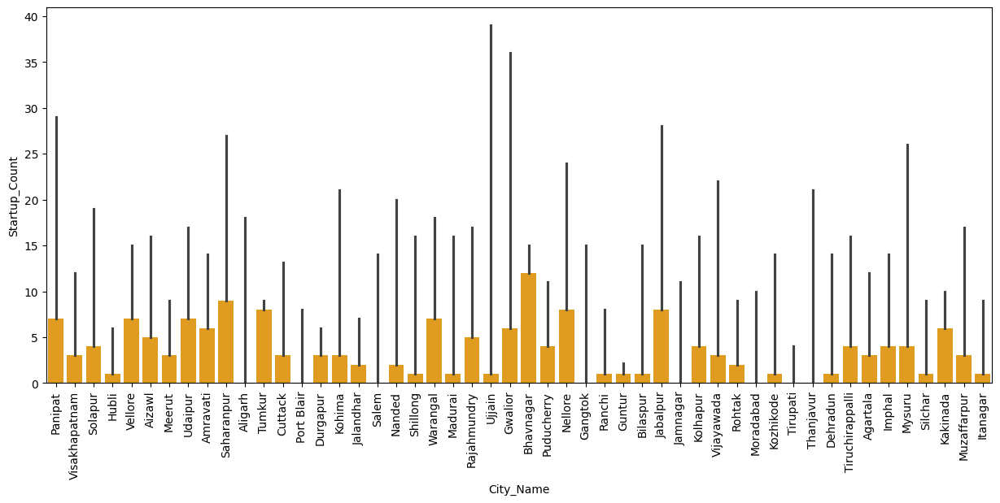

In [170]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Startup_Count',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

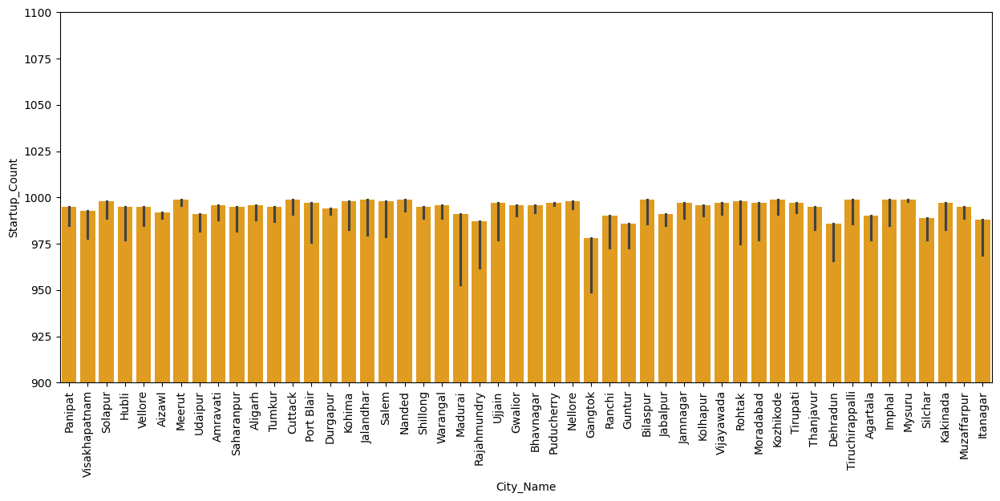

In [171]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Startup_Count',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(900, 1100)
plt.show

#### State, Startup_Count

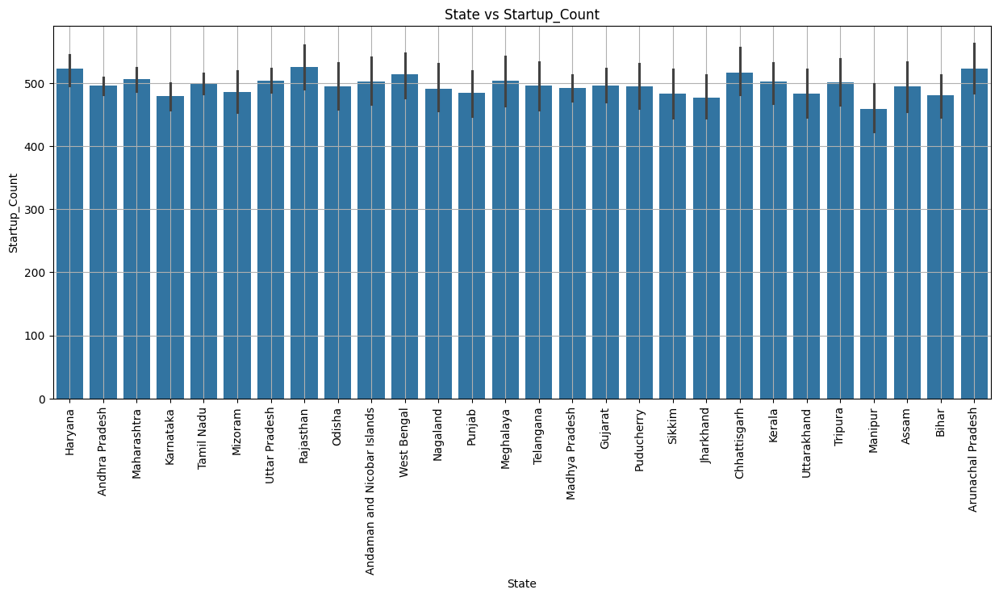

In [173]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Startup_Count',data = df_city_growth_dataset)
plt.title('State vs Startup_Count')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

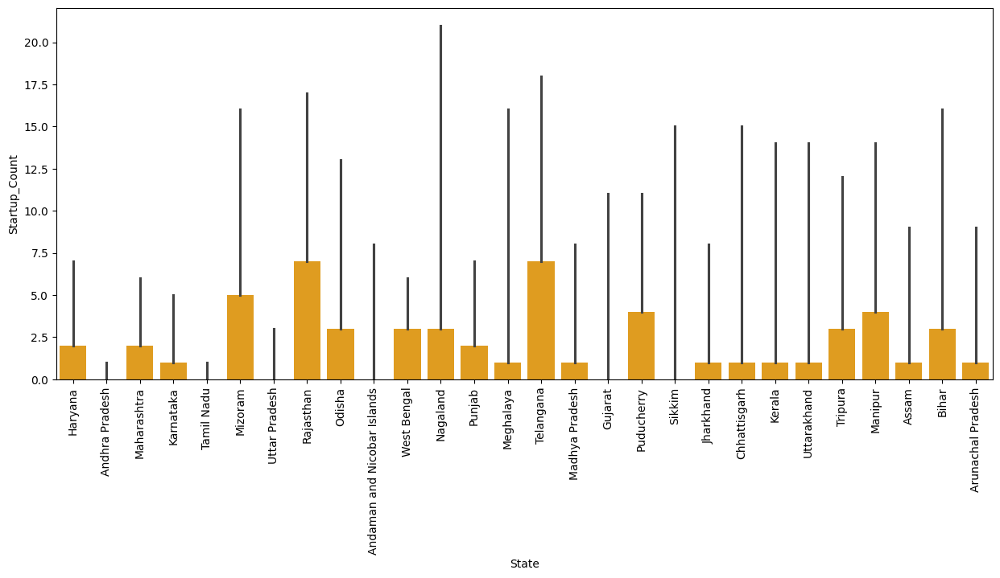

In [174]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Startup_Count',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

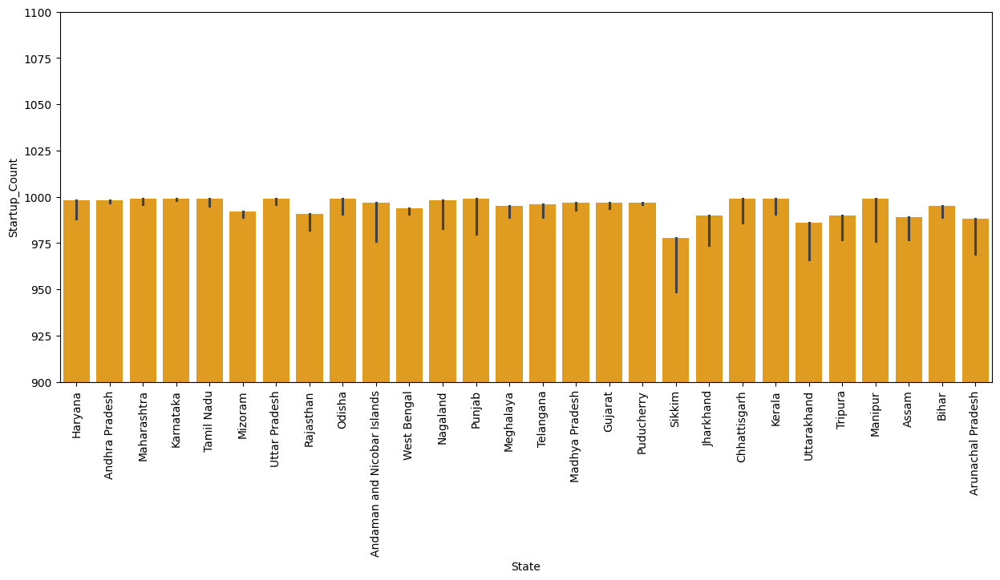

In [175]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Startup_Count',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(900, 1100)
plt.show

#### City_Name, Road_Connectivity_Score

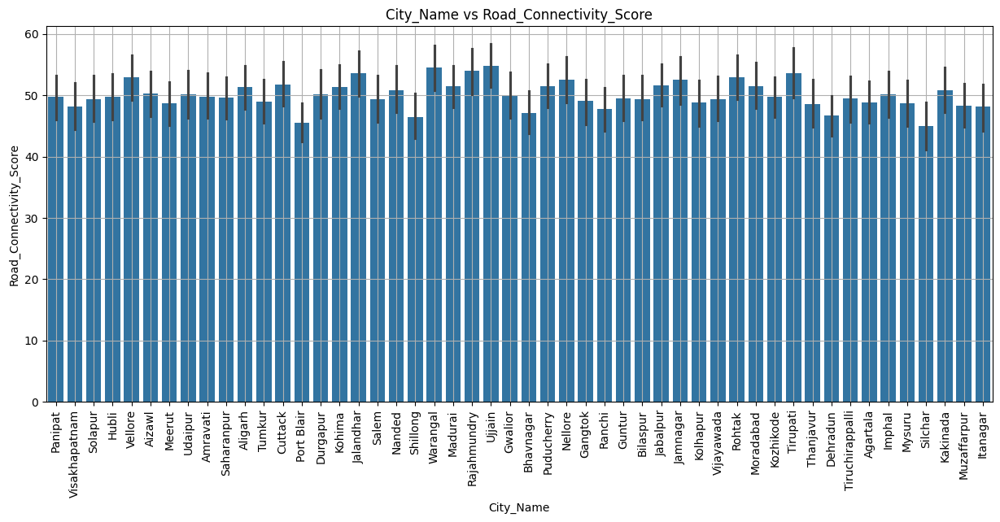

In [177]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Road_Connectivity_Score',data = df_city_growth_dataset)
plt.title('City_Name vs Road_Connectivity_Score')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

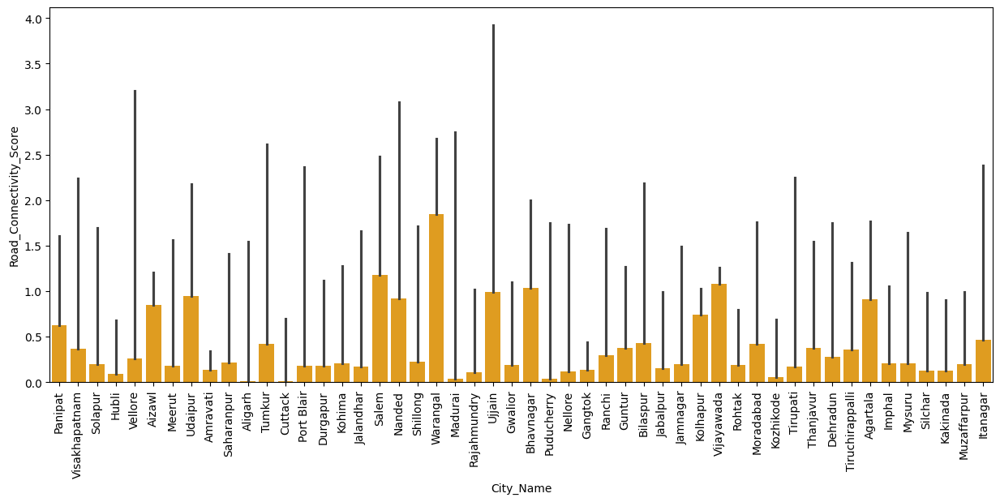

In [178]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Road_Connectivity_Score',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

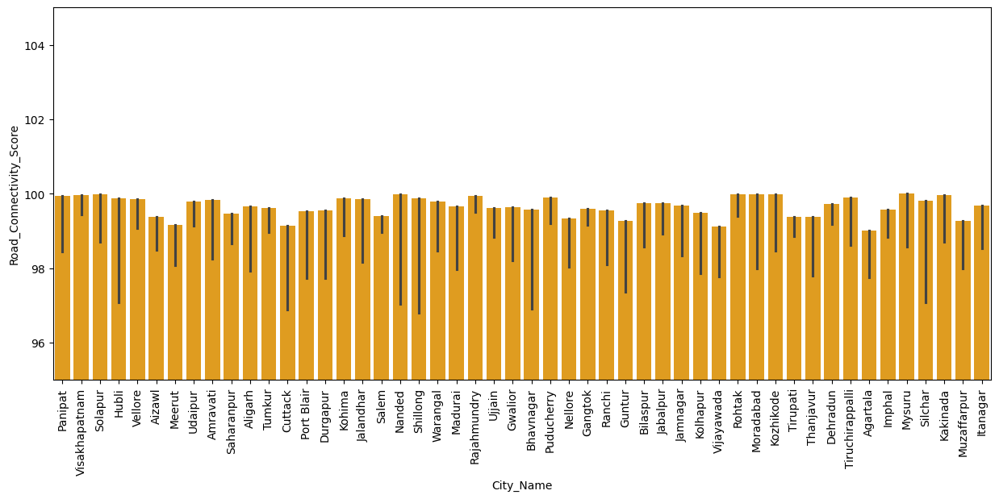

In [179]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Road_Connectivity_Score',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(95, 105)
plt.show

#### State, Road_Connectivity_Score

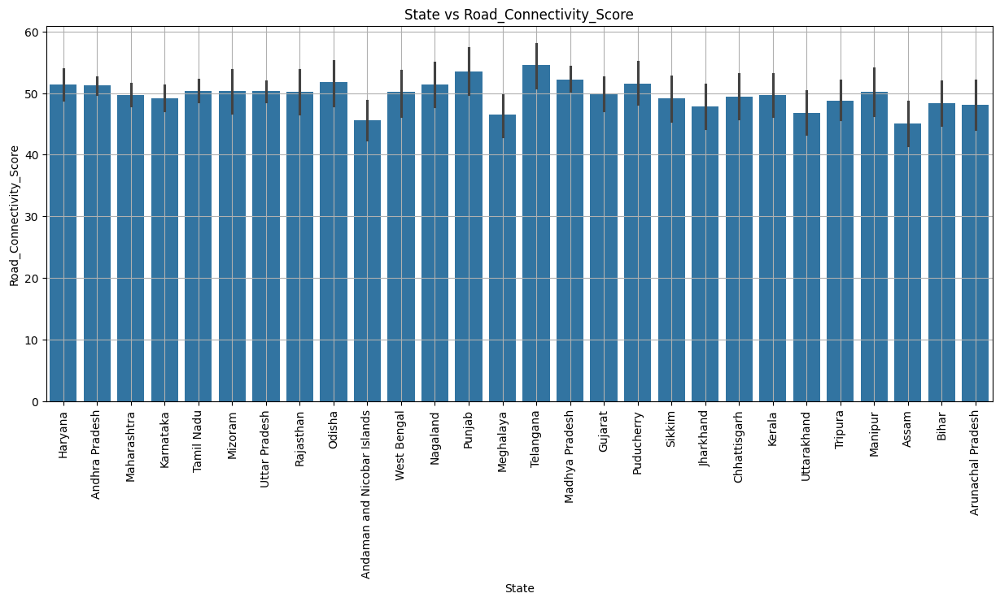

In [181]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Road_Connectivity_Score',data = df_city_growth_dataset)
plt.title('State vs Road_Connectivity_Score')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

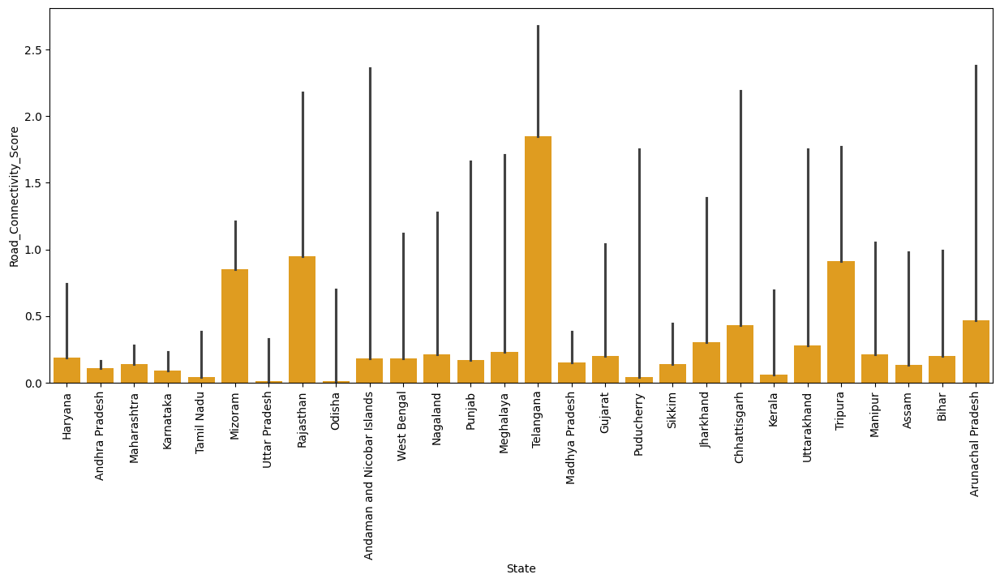

In [182]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Road_Connectivity_Score',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

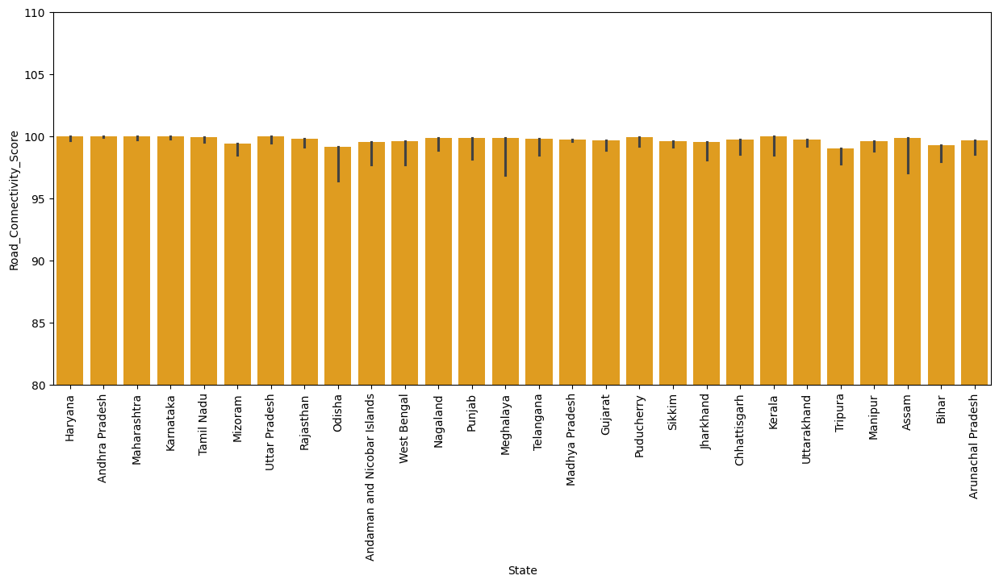

In [183]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Road_Connectivity_Score',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(80, 110)
plt.show

#### City_Name, Public_Transport_Availability

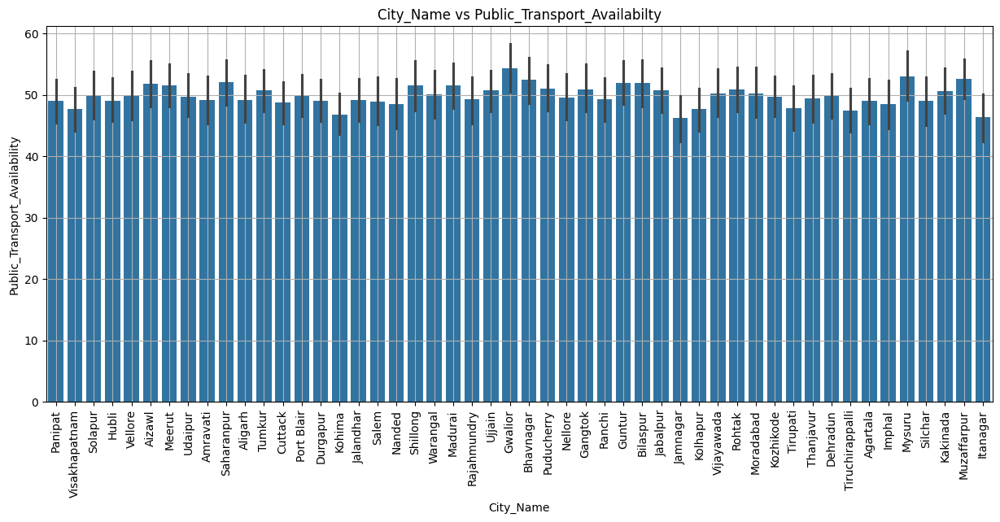

In [185]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Public_Transport_Availability',data = df_city_growth_dataset)
plt.title('City_Name vs Public_Transport_Availabilty')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

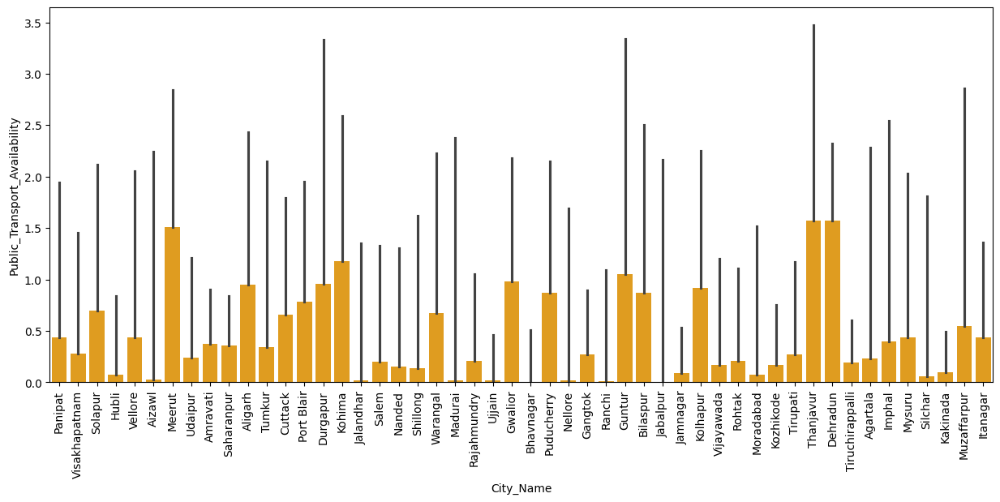

In [186]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Public_Transport_Availability',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

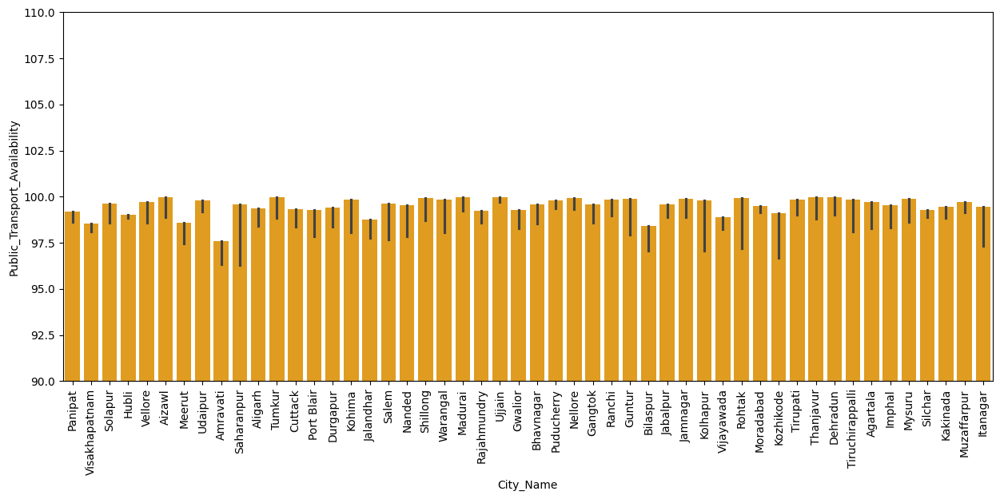

In [187]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Public_Transport_Availability',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(90, 110)
plt.show

#### State, Public_Transport_Availability

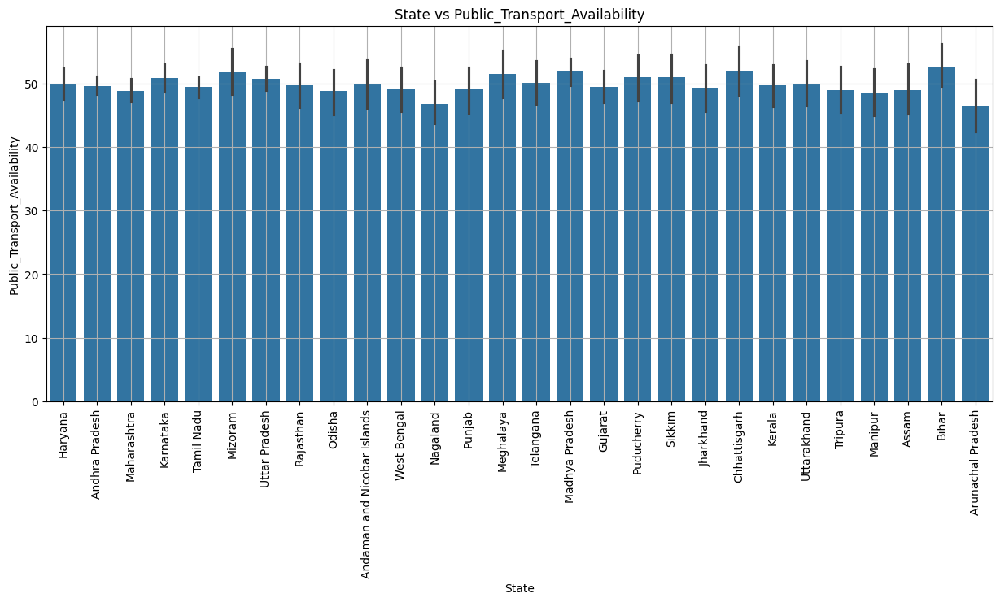

In [189]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Public_Transport_Availability',data = df_city_growth_dataset)
plt.title('State vs Public_Transport_Availability')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

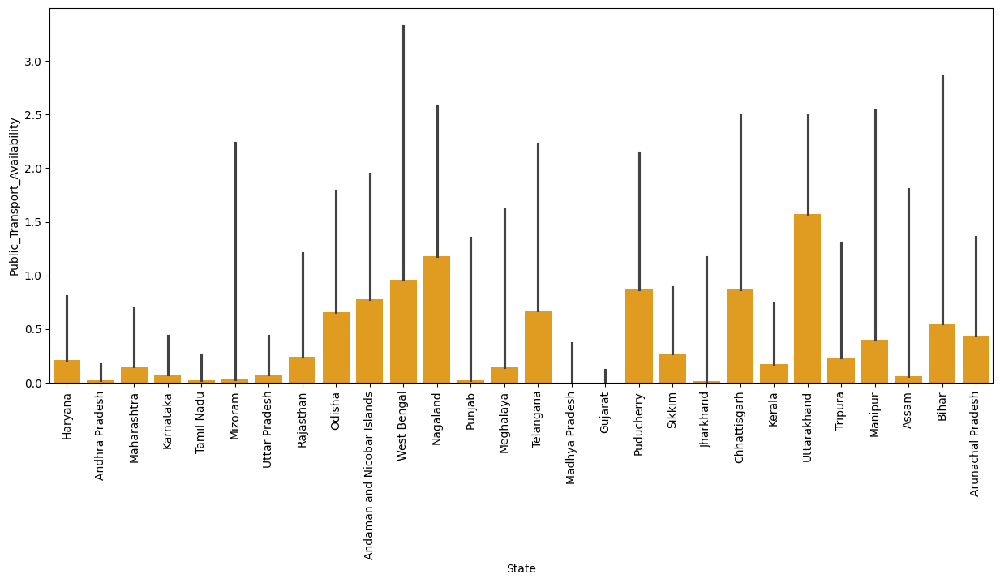

In [190]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Public_Transport_Availability',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

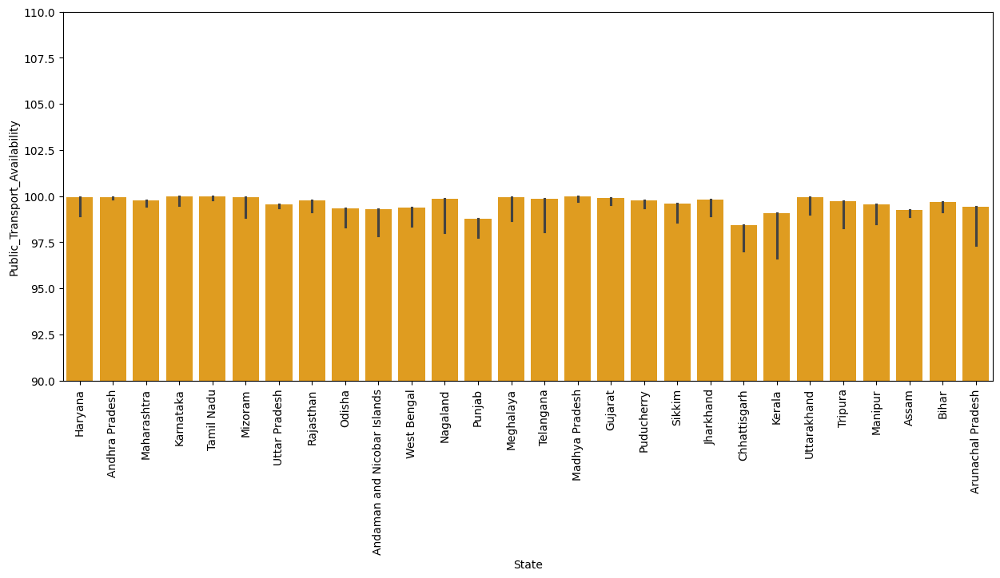

In [191]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Public_Transport_Availability',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(90, 110)
plt.show

#### City_Name, Affordability_Index

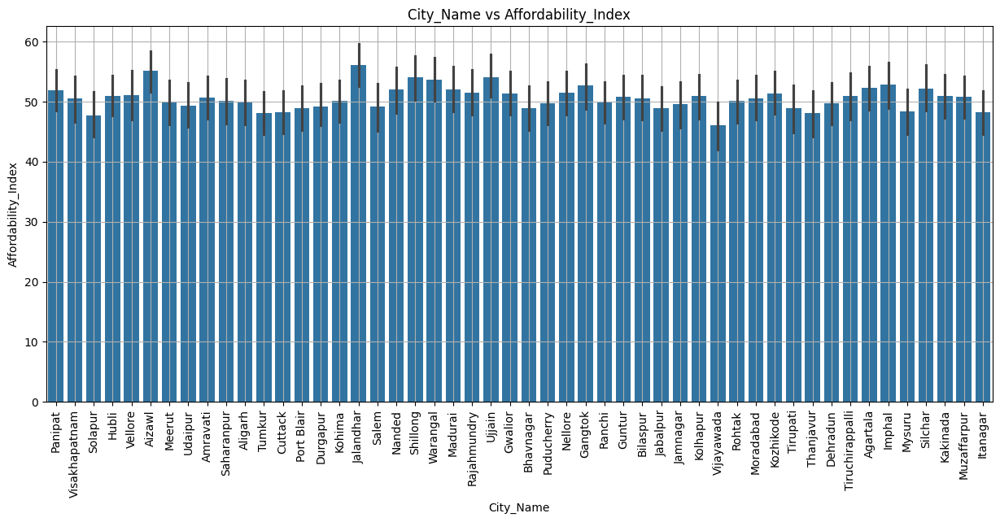

In [193]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Affordability_Index',data = df_city_growth_dataset)
plt.title('City_Name vs Affordability_Index')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

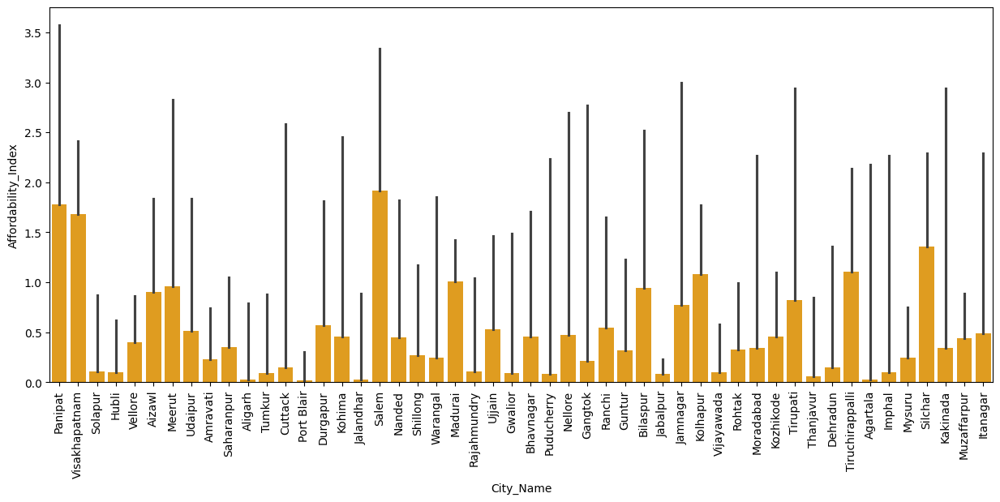

In [194]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Affordability_Index',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

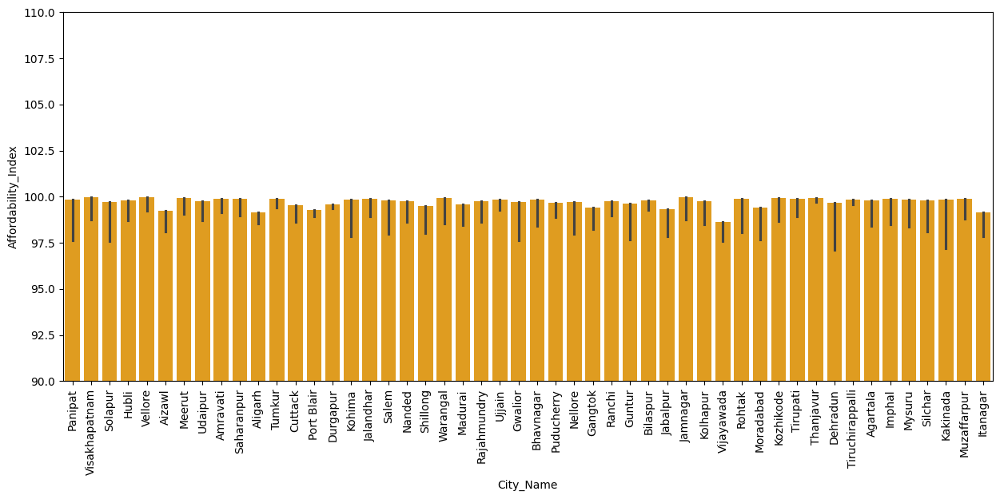

In [195]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='City_Name',y='Affordability_Index',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(90, 110)
plt.show

#### State, Affordability_Index

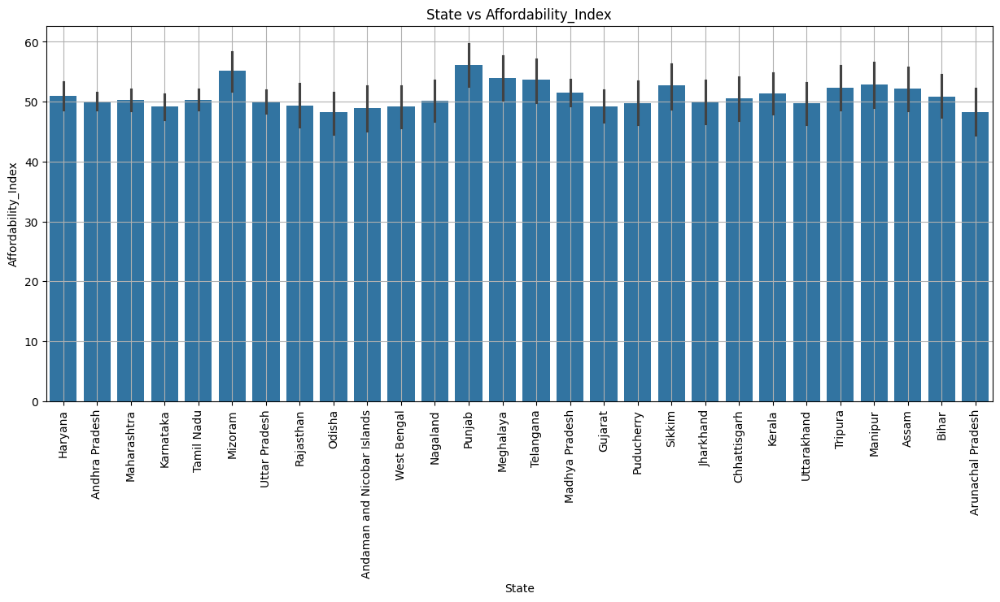

In [197]:
# plot the bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Affordability_Index',data = df_city_growth_dataset)
plt.title('State vs Affordability_Index')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

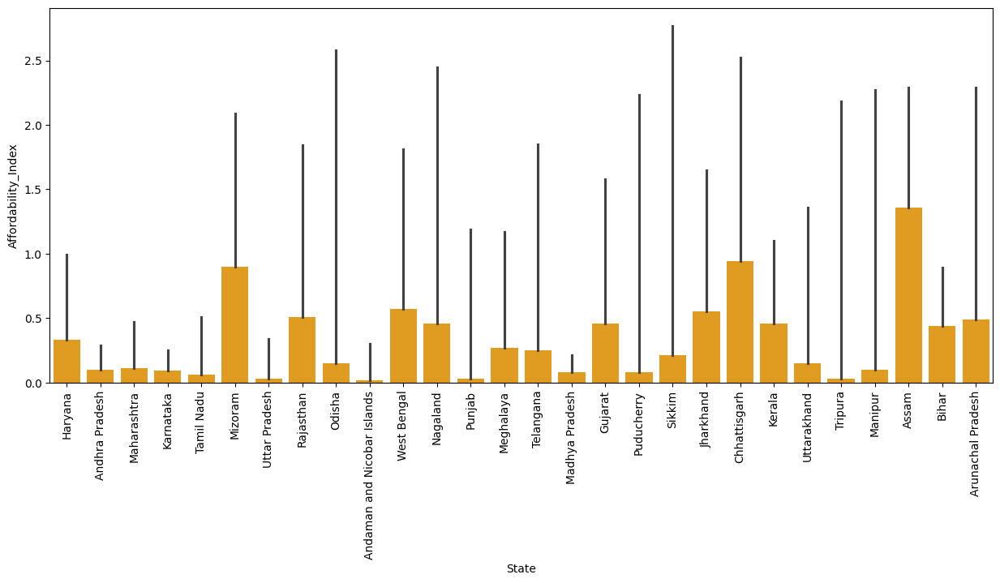

In [198]:
# plot the min bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Affordability_Index',data = df_city_growth_dataset,color='orange',estimator=min)
plt.xticks(rotation = 90)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

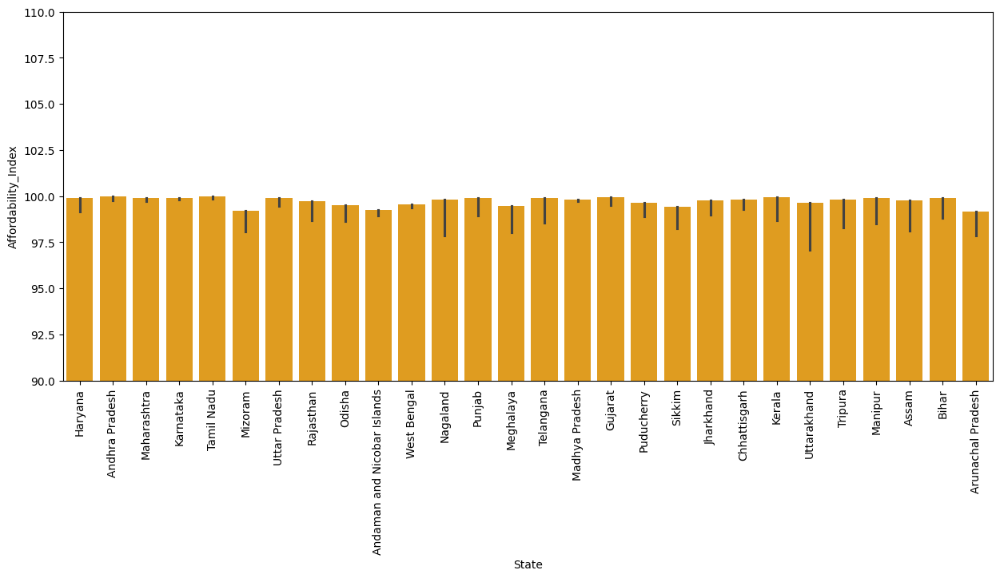

In [199]:
# plot the max bar graph
plt.figure(figsize=(15, 6))
sns.barplot(x='State',y='Affordability_Index',data = df_city_growth_dataset,color='orange',estimator=max)
plt.xticks(rotation = 90)
plt.ylim(90, 110)
plt.show

### MULTIVARIATE ANALYSIS

#### Multivariate Analysis for Numerical Columns

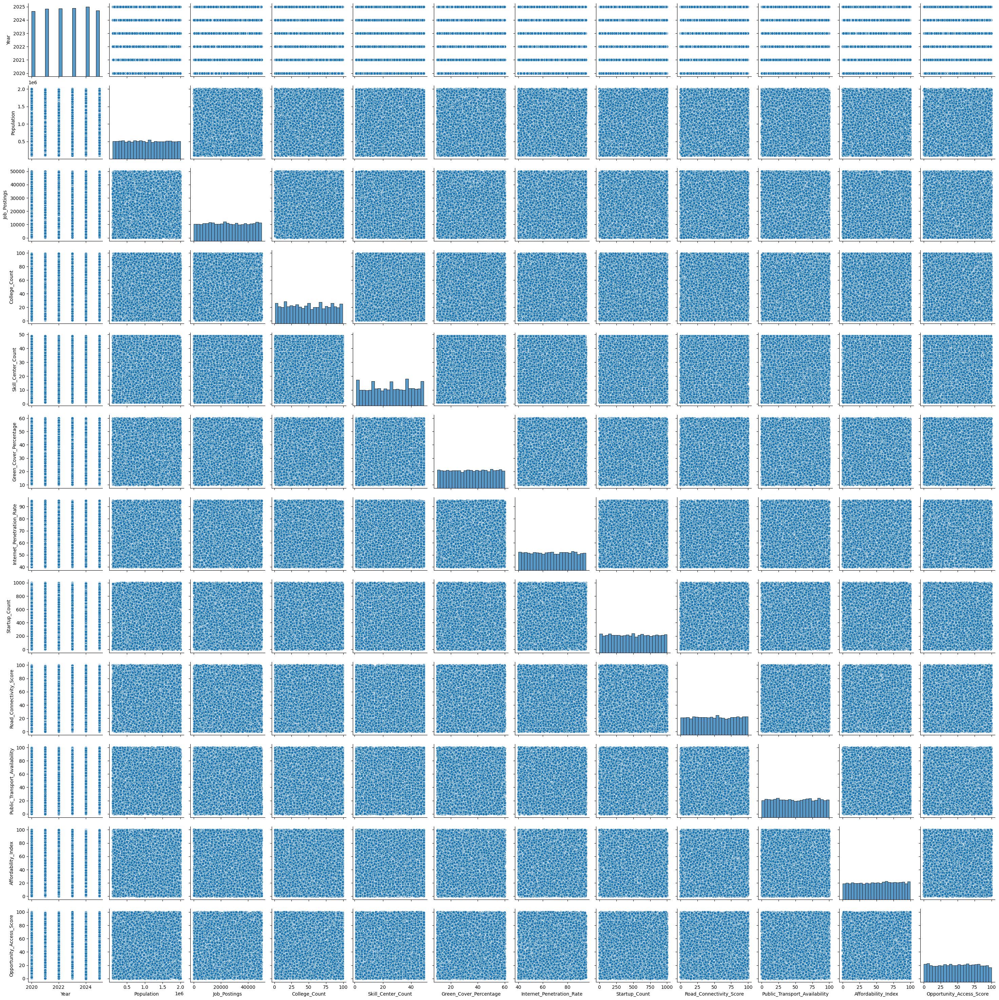

In [202]:
# Pair Plot
sns.pairplot(df_num)
plt.show()

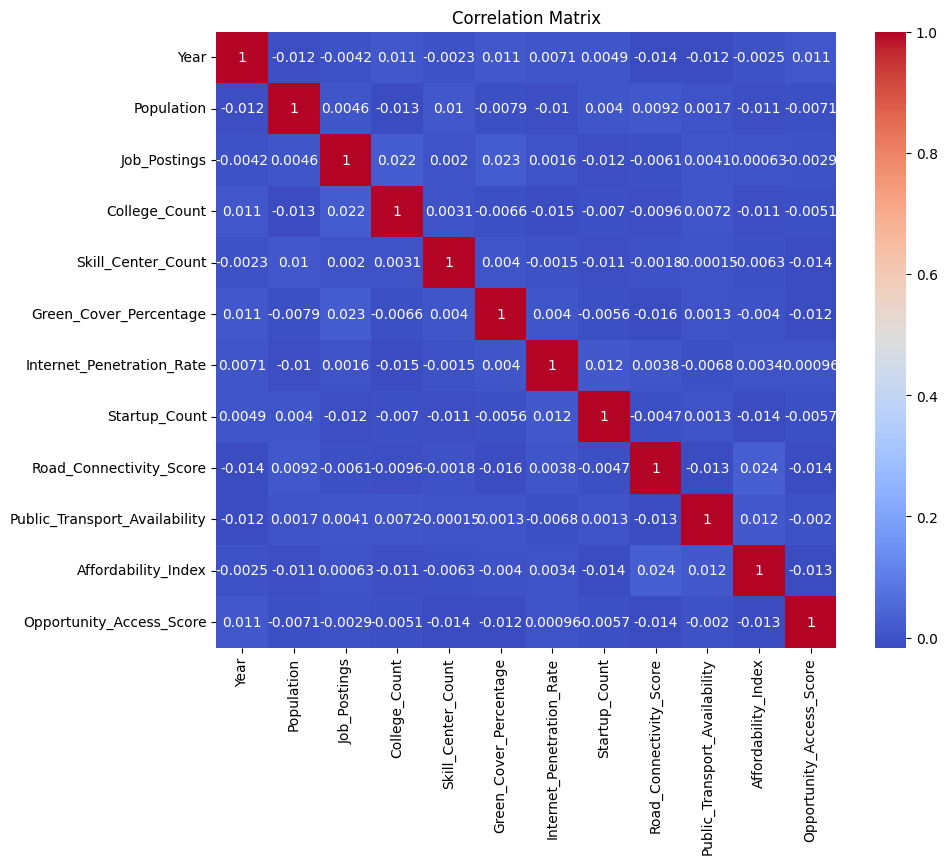

In [203]:
# Heatmap
plt.figure(figsize=(10, 8))
corr = df_num.corr()
sns.heatmap(corr, annot = True, cmap = 'coolwarm')
plt.title('Correlation Matrix')
plt.show()

#### Multivariate Analysis for Categorical Columns

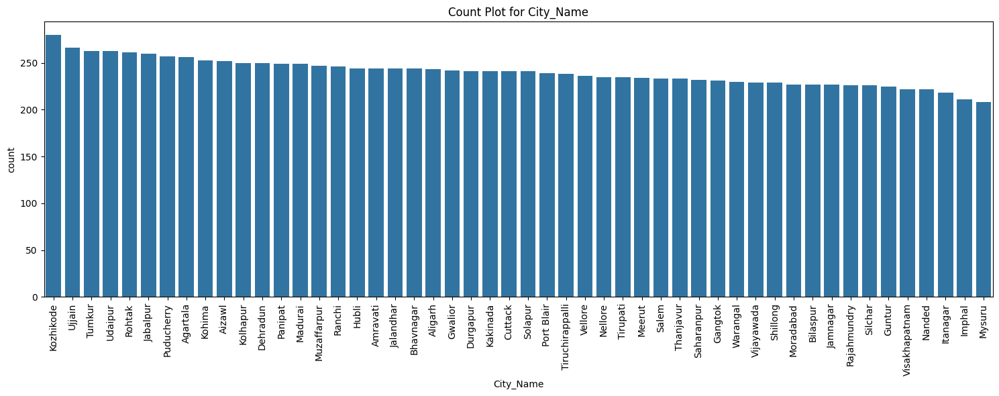

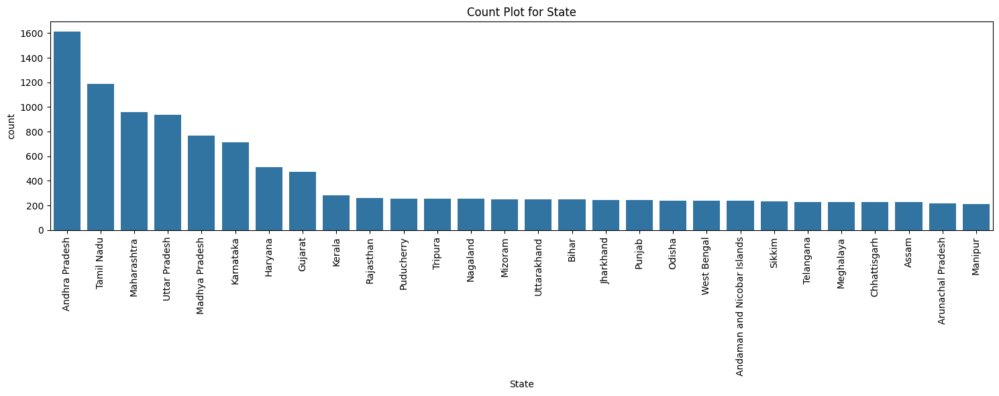

In [205]:
# Count Plot
for cat_cols in df_cat.columns:
    plt.figure(figsize = (15, 6))
    sns.countplot(data = df_city_growth_dataset, x = cat_cols, order = df_city_growth_dataset[cat_cols].value_counts().index)
    plt.xticks(rotation = 90)
    plt.title(f"Count Plot for {cat_cols}")
    plt.tight_layout()
    plt.show()

### Numerical vs Categorical Columns

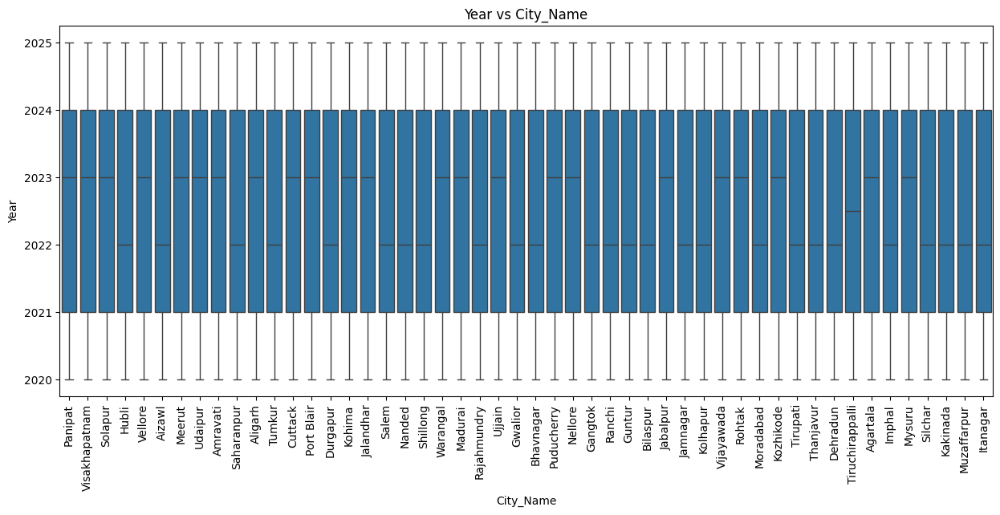

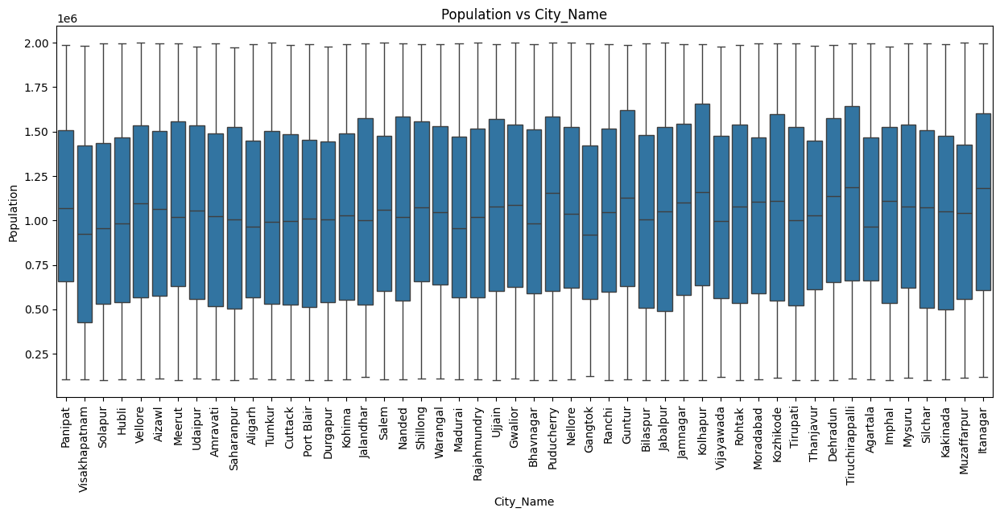

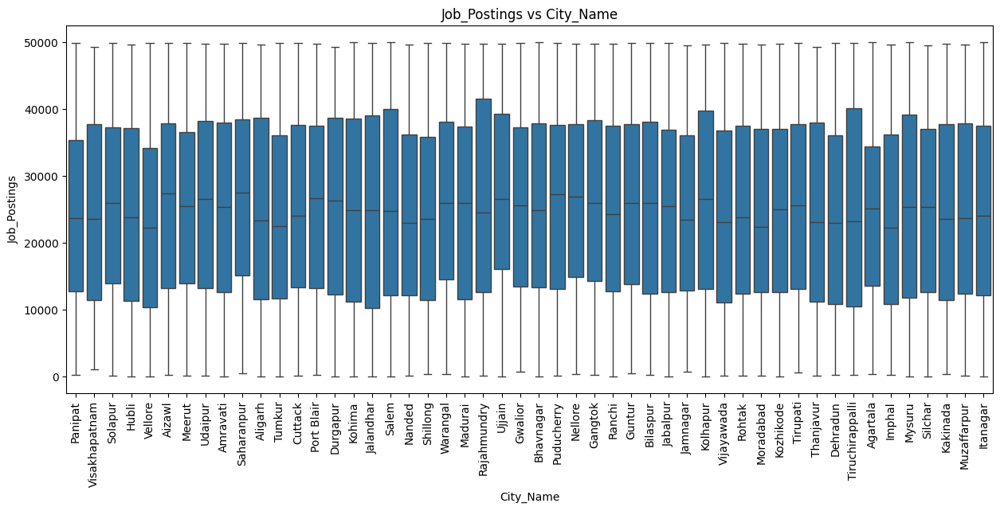

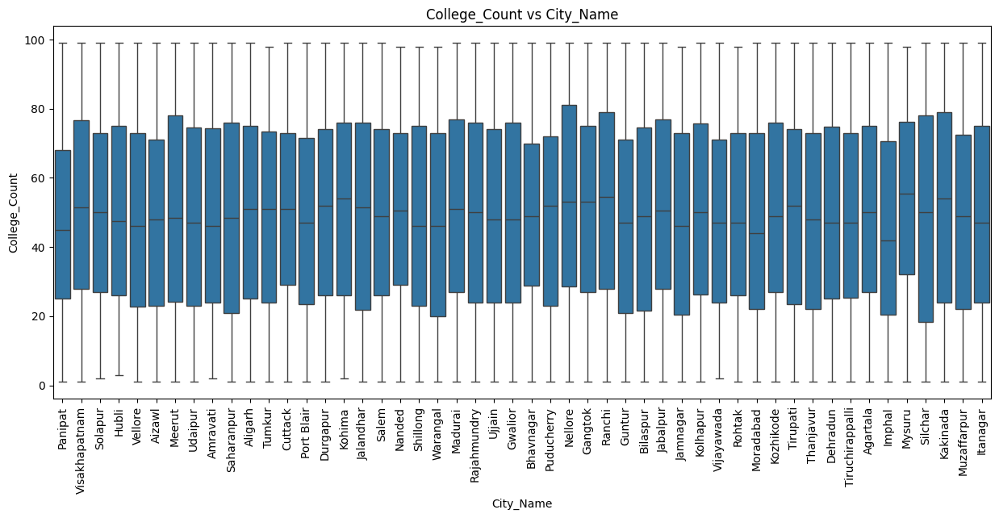

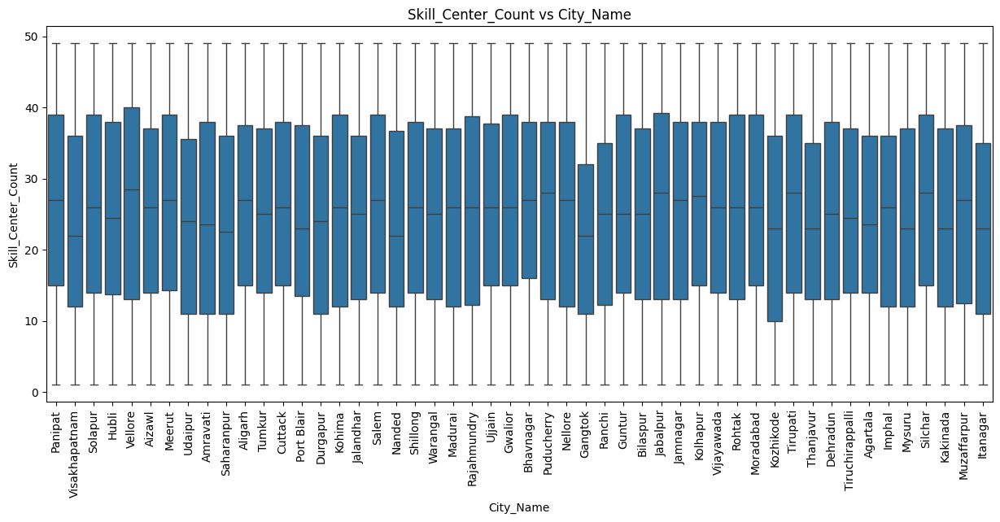

...

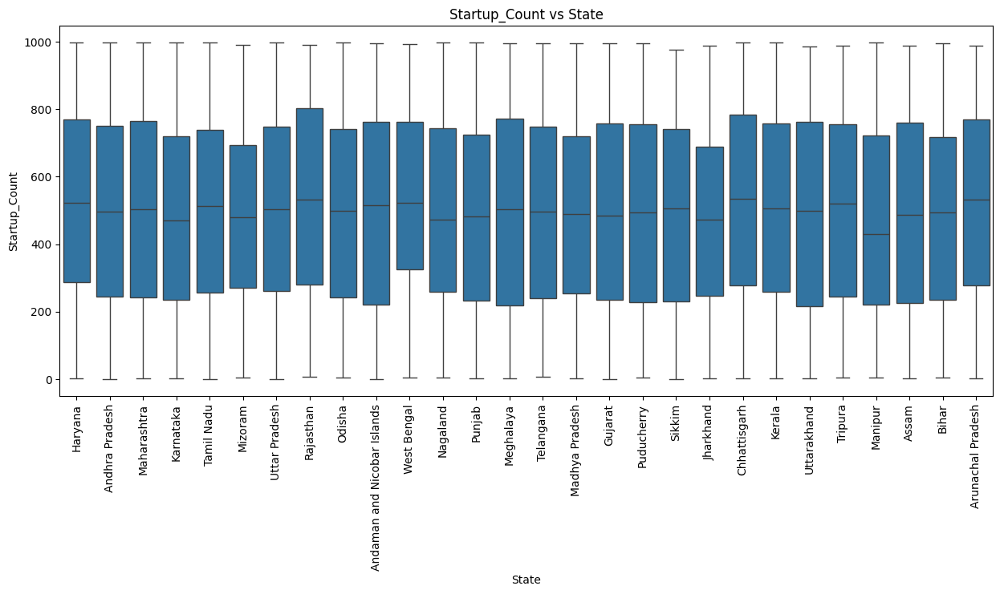

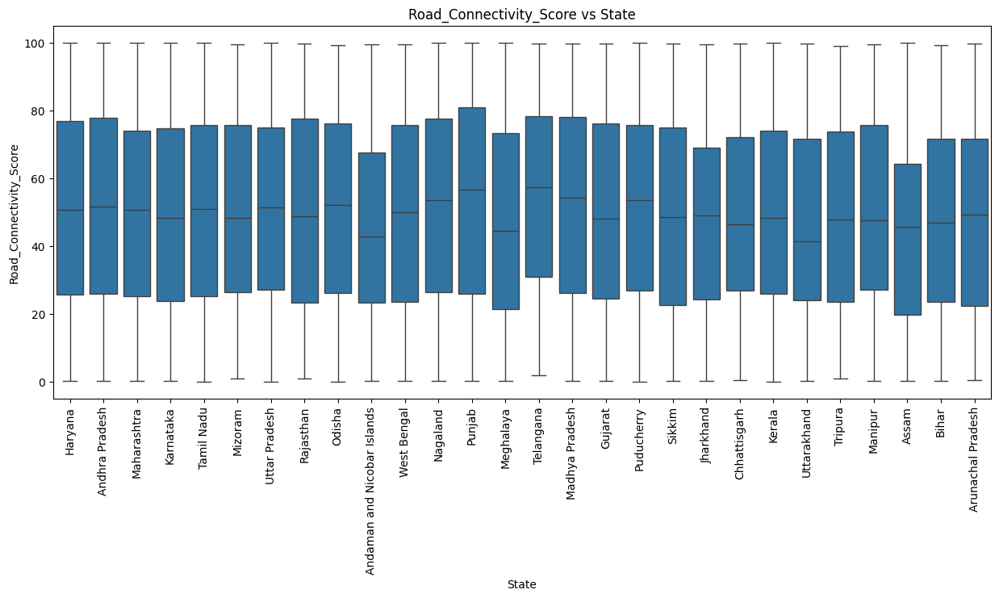

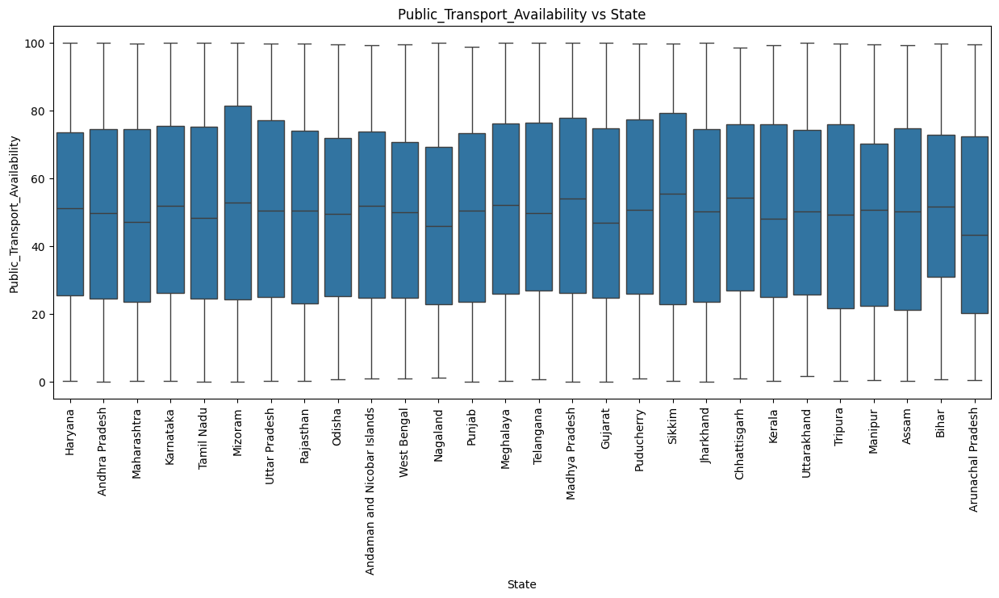

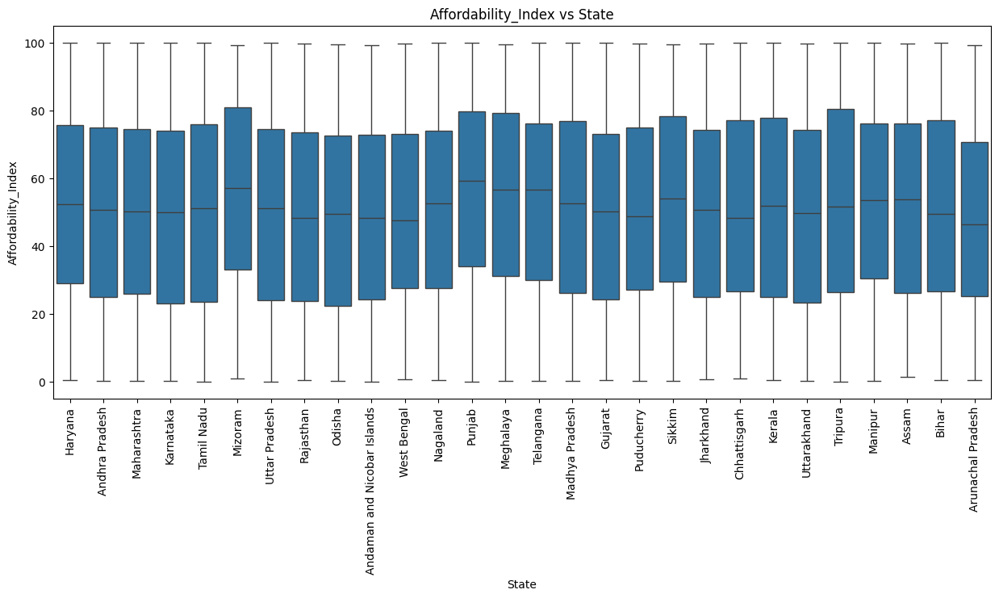

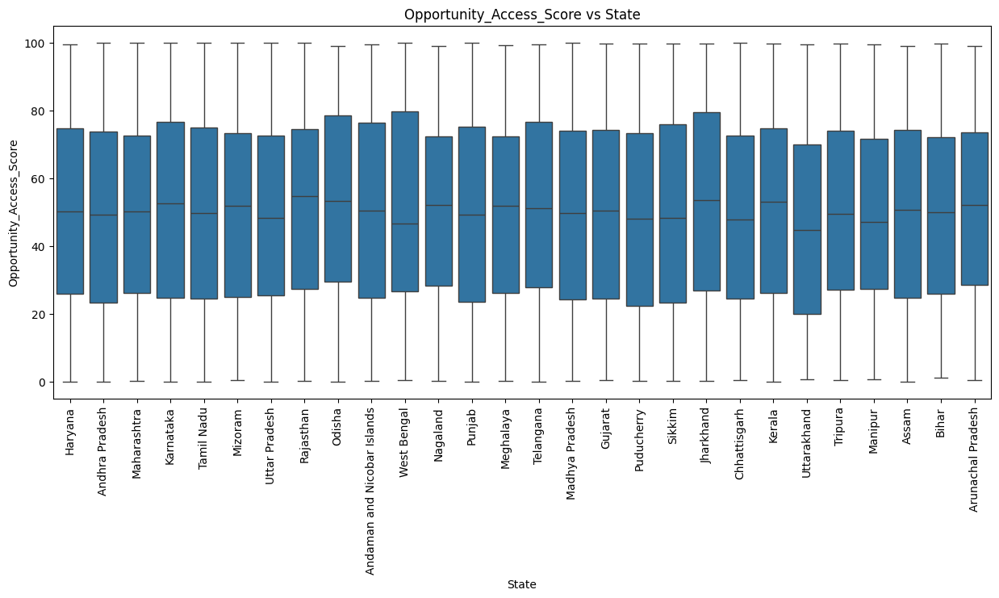

In [207]:
for cat_cols in df_cat.columns:
    for num_cols in df_num.columns:
        plt.figure(figsize = (15, 6))
        sns.boxplot(x = df_city_growth_dataset[cat_cols], y = df_city_growth_dataset[num_cols])
        plt.xticks(rotation = 90)
        plt.title(f"{num_cols} vs {cat_cols}")
        plt.show()

## Decide the target variable

In [209]:
# Check the data frame to dedcide the target variable
df_city_growth_dataset.head()

,City_Name,State,Year,Population,Job_Postings,College_Count,Skill_Center_Count,Green_Cover_Percentage,Internet_Penetration_Rate,Startup_Count,Road_Connectivity_Score,Public_Transport_Availability,Affordability_Index,Opportunity_Access_Score
0,Panipat,Haryana,2023,231932,38158,72,21,17.80,48.58,330,45.92,33.37,14.29,65.09
1,Visakhapatnam,Andhra Pradesh,2023,427069,2433,64,21,40.87,73.64,252,43.19,29.12,61.19,13.95
2,Solapur,Maharashtra,2023,748143,189,62,47,40.92,61.04,243,59.24,4.65,60.75,17.05
3,Panipat,Haryana,2021,765987,8792,60,14,50.42,56.75,564,23.09,24.10,68.33,61.00
4,Hubli,Karnataka,2022,704365,35920,36,40,47.77,63.38,565,54.67,18.49,96.96,77.51


In [210]:
# Decided to take Green_Cover_Percentage as the target variable(dependent variable)
target = df_city_growth_dataset.Green_Cover_Percentage

# After storing this variable into target, we have to remove it from the main data frame(independent variables)
df_city_growth_dataset = df_city_growth_dataset.drop('Green_Cover_Percentage', axis = 1)

## Prepare the data for Machine Learning

In [212]:
# Seggregate the data based on the data types
df_num = df_city_growth_dataset.select_dtypes(include = 'number')

In [213]:
# Make separate data frame for categorical variables
df_cat = df_city_growth_dataset.select_dtypes(include = 'object')

### Perform encoding on categorical variables

In [215]:
# Perform encoding(one hot encoding)
df_encoded = pd.get_dummies(df_cat)

In [216]:
# Check the encoded data
df_encoded.head()

,City_Name_Agartala,City_Name_Aizawl,City_Name_Aligarh,City_Name_Amravati,City_Name_Bhavnagar,City_Name_Bilaspur,City_Name_Cuttack,City_Name_Dehradun,City_Name_Durgapur,City_Name_Gangtok,...,State_Puducherry,State_Punjab,State_Rajasthan,State_Sikkim,State_Tamil Nadu,State_Telangana,State_Tripura,State_Uttar Pradesh,State_Uttarakhand,State_West Bengal
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### Scale the numerical variables

In [218]:
# import the standard scalar subpackage for performing the scaling
from sklearn.preprocessing import StandardScaler

In [219]:
# Initiate the standard scaler
ss = StandardScaler()

In [220]:
# Transform the numerical variables
scale = ss.fit_transform(df_num)

# Check the tranformed data
scale

array([[ 0.28852462, -1.48540019,  0.90282387, ..., -0.57244198,
        -1.26098745,  0.5356156 ],
       [ 0.28852462, -1.12974725, -1.56819545, ..., -0.71941539,
         0.36629639, -1.24602449],
       [ 0.28852462, -0.54456396, -1.72340797, ..., -1.56563645,
         0.35102976, -1.13802519],
       ...,
       [-0.30120378, -1.52085485,  0.89763628, ..., -1.55975751,
         0.60431701, -0.41721695],
       [ 1.46798141,  0.37455622,  0.73350111, ..., -1.24125748,
        -1.13260898, -0.7471374 ],
       [-1.48066057,  1.23953482,  0.59613388, ...,  1.55607891,
        -1.72835447,  0.83522656]], shape=(12000, 11))

In [221]:
# Create a new data frame for scaled data
df_scaled = pd.DataFrame(scale, columns = df_num.columns)

In [222]:
# Check the scaled data frame
df_scaled.head()

,Year,Population,Job_Postings,College_Count,Skill_Center_Count,Internet_Penetration_Rate,Startup_Count,Road_Connectivity_Score,Public_Transport_Availability,Affordability_Index,Opportunity_Access_Score
0,0.288525,-1.485400,0.902824,0.781857,-0.298958,-1.187111,-0.578690,-0.145308,-0.572442,-1.260987,0.535616
1,0.288525,-1.129747,-1.568195,0.502545,-0.298958,0.391260,-0.847684,-0.239726,-0.719415,0.366296,-1.246024
2,0.288525,-0.544564,-1.723408,0.432717,1.537200,-0.402335,-0.878722,0.315365,-1.565636,0.351030,-1.138025
3,-0.890932,-0.512042,-1.128357,0.362890,-0.793308,-0.672534,0.228294,-0.934885,-0.893017,0.614032,0.393126
4,-0.301204,-0.624353,0.748026,-0.475045,1.042849,-0.254953,0.231743,0.157311,-1.087022,1.607404,0.968310


### Concatenate both the encoded and scaled data frame

In [224]:
# Concatenation
X = pd.concat([df_encoded, df_scaled], axis = 1)

# Check the concatenated data
X.head()

,City_Name_Agartala,City_Name_Aizawl,City_Name_Aligarh,City_Name_Amravati,City_Name_Bhavnagar,City_Name_Bilaspur,City_Name_Cuttack,City_Name_Dehradun,City_Name_Durgapur,City_Name_Gangtok,...,Population,Job_Postings,College_Count,Skill_Center_Count,Internet_Penetration_Rate,Startup_Count,Road_Connectivity_Score,Public_Transport_Availability,Affordability_Index,Opportunity_Access_Score
0,False,False,False,False,False,False,False,False,False,False,...,-1.485400,0.902824,0.781857,-0.298958,-1.187111,-0.578690,-0.145308,-0.572442,-1.260987,0.535616
1,False,False,False,False,False,False,False,False,False,False,...,-1.129747,-1.568195,0.502545,-0.298958,0.391260,-0.847684,-0.239726,-0.719415,0.366296,-1.246024
2,False,False,False,False,False,False,False,False,False,False,...,-0.544564,-1.723408,0.432717,1.537200,-0.402335,-0.878722,0.315365,-1.565636,0.351030,-1.138025
3,False,False,False,False,False,False,False,False,False,False,...,-0.512042,-1.128357,0.362890,-0.793308,-0.672534,0.228294,-0.934885,-0.893017,0.614032,0.393126
4,False,False,False,False,False,False,False,False,False,False,...,-0.624353,0.748026,-0.475045,1.042849,-0.254953,0.231743,0.157311,-1.087022,1.607404,0.968310


## Split the data in Training Set and Testing Set 

In [226]:
# import the train test split
from sklearn.model_selection import train_test_split

In [227]:
# Create xtrain, xtest, ytrain, ytest
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size = 0.20, random_state = 42)

In [228]:
# Authetic check training set
print(X_train.shape)

print(y_train.shape)

(9600, 89)
(9600,)


In [229]:
# Authentic check for testing set
print(X_test.shape)

print(y_test.shape)

(2400, 89)
(2400,)


## Find the base Machine Learning Algorithm

### Linear Regression

In [232]:
# import Linear Regression Algorithm and evaluation matrix 
from sklearn.linear_model import LinearRegression

# Here we are using MSE as evaluation matrix
from sklearn.metrics import mean_squared_error

In [233]:
# Create a Linear Regression Model
model = LinearRegression()

In [234]:
# Fit the model to the training data
model.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [235]:
# Predicting on the testing data
predictions = model.predict(X_test)

In [236]:
# Calculate mean squared error
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error:", mse)

Mean Squared Error: 211.23462039543327


### Ridge Model

In [238]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

# Assuming X_train, X_test, y_train, y_test are already defined from train_test_split

# Create a Ridge regression model
ridge_model = Ridge(alpha=1.0)  # alpha is the regularization strength

# Fit the model to the training data
ridge_model.fit(X_train, y_train)

# Predict on the testing data
predictions = ridge_model.predict(X_test)

# Calculate mean squared error
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error:", mse)

Mean Squared Error: 211.22086327641026


### Lasso Model

In [240]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

# Assuming X_train, X_test, y_train, y_test are already defined from train_test_split

# Create a Lasso regression model
lasso_model = Lasso(alpha=1.0)  # alpha is the regularization strength

# Fit the model to the training data
lasso_model.fit(X_train, y_train)

# Predict on the testing data
predictions = lasso_model.predict(X_test)

# Calculate mean squared error
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error:", mse)

Mean Squared Error: 209.04330959259116


### Decision Tree Regressor

In [242]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error

# Assuming X_train, X_test, y_train, y_test are already defined from train_test_split

# Create a Decision Tree regression model
tree_model = DecisionTreeRegressor()

# Fit the model to the training data
tree_model.fit(X_train, y_train)

# Predict on the testing data
predictions = tree_model.predict(X_test)

# Calculate mean squared error
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error:", mse)

Mean Squared Error: 429.78000754166663


### Random Forest Regressor

In [244]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Assuming X_train, X_test, y_train, y_test are already defined from train_test_split

# Create a Random Forest regression model
forest_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model to the training data
forest_model.fit(X_train, y_train)

# Predict on the testing data
predictions = forest_model.predict(X_test)

# Calculate mean squared error
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error:", mse)

Mean Squared Error: 213.2647815558125


### SVR

In [246]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error

# Assuming X_train, X_test, y_train, y_test are already defined from train_test_split

# Create a SVM regression model
svm_model = SVR(kernel='rbf')  # 'rbf' kernel is commonly used for non-linear regression

# Fit the model to the training data
svm_model.fit(X_train, y_train)

# Predict on the testing data
predictions = svm_model.predict(X_test)

# Calculate mean squared error
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error:", mse)

Mean Squared Error: 209.91509818449387


**Interpretation**
 - As per this method, we can conclude that Lasso Model is our base algorithm because it has least MSE as compared to others.

## Hyper Parameter Tuning using Cross Validation

In [249]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, make_scorer

# Create scorer for MSE
mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

# Parameter grid for alpha
param_grid = {
    'alpha': np.logspace(-4, 2, 10)  # 10 values from 0.0001 to 100
}

# Lasso model
lasso = Lasso(max_iter=10000, random_state=42)

# GridSearchCV with verbose output
grid_search = GridSearchCV(
    estimator=lasso,
    param_grid=param_grid,
    scoring=mse_scorer,
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Fit model
grid_search.fit(X, target)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


,estimator,Lasso(max_ite...ndom_state=42)
,param_grid,{'alpha': array([1.0000...00000000e+02])}
,scoring,make_scorer(m...hod='predict')
,n_jobs,-1
,refit,True
,cv,5
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(1.0)


In [250]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import Lasso

# Step 1: Base Lasso model for RFE
base_model = Lasso(alpha=0.01, max_iter=10000, random_state=42)  # Example alpha

# Step 2: Perform RFE to select features
n_features_to_select = 10  # Change as needed
rfe = RFE(estimator=base_model, n_features_to_select=n_features_to_select)
X_train_rfe = rfe.fit_transform(X_train, y_train)

# Step 3: Train final Lasso model using only selected features
final_model = Lasso(alpha=0.01, max_iter=10000, random_state=42)
final_model.fit(X_train_rfe, y_train)

# Step 4: Get selected feature names
selected_features = X_train.columns[rfe.support_]
print("Selected Features:", list(selected_features))


Selected Features: ['City_Name_Aligarh', 'City_Name_Amravati', 'City_Name_Itanagar', 'City_Name_Jalandhar', 'City_Name_Kolhapur', 'City_Name_Kozhikode', 'City_Name_Meerut', 'City_Name_Rajahmundry', 'City_Name_Silchar', 'City_Name_Tiruchirappalli']


In [251]:
import joblib
import json

# Save trained model
joblib.dump(final_model, 'model.pkl')

# Save selected feature names
with open('selected_features.json', 'w') as f:
    json.dump(list(selected_features), f)
